# "Project2"
> "ML을 이용한 대출 채무이행 판별"

- toc:true
- branch: master
- badges: true
- comments: true
- author: channee
- categories: [jupyter, ML, MachineLearning]

### 데이터 선정
* COVID-19의 영향으로 가계대출이 급증하였다. 에에 가계부채가 사상 최대치르 찍으며 주요 은행들로부터 대출 규졔가 시작되었습니다.
* 이에 대해 은행 입장에서 채무(Target)를 갚으 것인지에 대한 예측을 해보고자 합니다.
* 데이터는 Kaggle의 'Home Credit Default Risk'로 부터 가져왔습니다.

In [ ]:
import numpy as np
import pandas as pd
import gc
import time
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline



pd.set_option('display.max_rows', 100)
pd.set_option('display.max_columns', 200)

In [ ]:
app_train = pd.read_csv('application_train.csv')
app_test = pd.read_csv('application_test.csv')

In [ ]:
app_train.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

### Feature 설명(너무 많은 Feature로 일부만 소개하도록 하겠습니다.)
* SK_ID_CURR : 현재 대출 고유 ID
* TARGET : 타겟값(채무 이행/불이행)
* AMT_INCOME_TOTAL : 소득
* AMT_CREDIT : 대출금액
* AMT_ANNUITY : 월 대출 지급액
* AMT_GOODS_PRICE : 소비자 대출 상품액
* EXT_SOURCE_1 ~ EXT_SOURCE_3 : 정규화된 스코어
* APARTMENTS_AVG ~ EMERGENCYSTATE_MODE : 고객 거주지역의 특정값(정규화된 값)
* OBS_30_CNT_SOCIAL_CIRCLE : 30일 연체된 횟수
* DEF_30_CNT_SOCIAL_CIRCLE : 30일 연체로  Default 된 횟수
* OBS_60_CNT_SOCIAL_CIRCLE : 60일 연체된 횟수
* DEF_60_CNT_SOCIAL_CIRCLE : 60일 연체로  Default 된 횟수
* DAYS_LAST_PHONE_CHANGE : 대출 신청전 핸드폰 변경 횟수
* FLAG_DOCUMENT_2 ~ FLAG_DOCUMENT_21 : 문서 제출 여부
* AMT_INSTALMENT : 대출 월 납입예정액
* AMT_PAYMENT : 실제 월 납입액

In [ ]:
app_train.shape, app_test.shape
# 매우 많은 feature과 Data..

((307511, 122), (48744, 121))

#### TARGET 값 분포 및 AMT_INCOME_TOTAL 값 Histogram
* TARGET값 별 분포도, Pandas, Matplotlib, Seaborn으로 histogram 표현

In [ ]:
app_train['TARGET'].value_counts()
# 치우쳐진(Skew) Data이다.

0    282686
1     24825
Name: TARGET, dtype: int64

<AxesSubplot:>

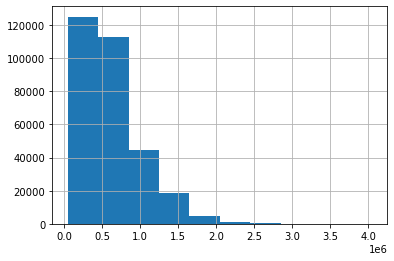

In [ ]:
app_train['AMT_CREDIT'].hist()

C:\Users\channee\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='AMT_INCOME_TOTAL', ylabel='Density'>

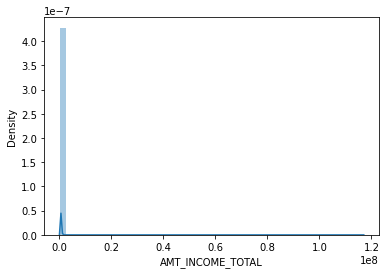

In [ ]:
sns.distplot(app_train['AMT_INCOME_TOTAL'])

C:\Users\channee\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='AMT_INCOME_TOTAL'>

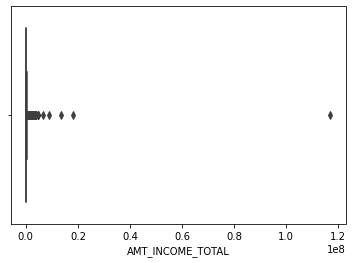

In [ ]:
sns.boxplot(app_train['AMT_INCOME_TOTAL'])


### AMT_INCOME_TOTAL은 매우 우측으로 치우쳐진(Skew) 데이터이다.
### AMT_INCOME_TOTAL이 1000000 이하인 값에 대한 분포도를 살펴보자.
* boolean indexing으로 filtering 후 histogram 표현

In [ ]:
app_train[app_train['AMT_INCOME_TOTAL'] < 1000000]

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.0220,0.0198,0.0,0.0000,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.0000,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.0790,0.0554,0.0,0.0000,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.0100,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

<AxesSubplot:>

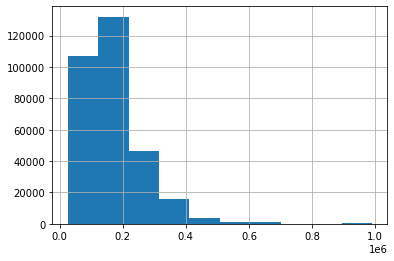

In [ ]:
# boolean indexing 으로 filtering 적용 
app_train[app_train['AMT_INCOME_TOTAL'] < 1000000]['AMT_INCOME_TOTAL'].hist()

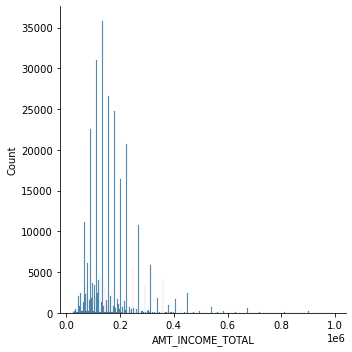

In [ ]:
sns.displot(app_train[app_train['AMT_INCOME_TOTAL'] < 1000000]['AMT_INCOME_TOTAL'])

C:\Users\channee\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='AMT_CREDIT', ylabel='Density'>

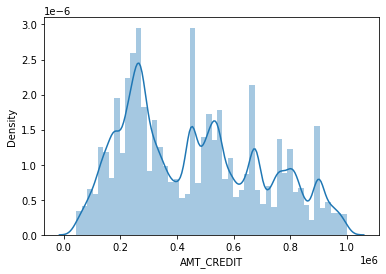

In [ ]:
# distplot으로 his(togram 표현 
sns.distplot(app_train[app_train['AMT_CREDIT'] < 1000000]['AMT_CREDIT']))

#### TARGET 값에 따른 AMT_INCOME_TOTAL값 분포도 비교
* distplot과 violinplot 시각화
* plt.subplots() 기반으로 seaborn의 distplot과 violinplot으로 분포도 비교 시각화

C:\Users\channee\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\channee\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='AMT_INCOME_TOTAL', ylabel='Density'>

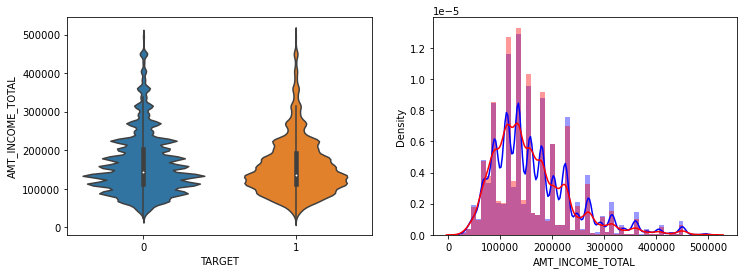

In [ ]:
# TARGET 값 유형에 따른 Boolean Indexing 조건
cond1 = (app_train['TARGET'] == 1)
cond0 = (app_train['TARGET'] == 0)
cond_amt = (app_train['AMT_INCOME_TOTAL'] < 500000)
# 2개의 subplot을 생성하고  왼쪽에는 violinplot을 오른쪽에는 distplot을 표현
fig, axs = plt.subplots(figsize=(12, 4), nrows=1, ncols=2, squeeze=False)
# violin plot을 왼쪽 subplot에 그림. 
sns.violinplot(x='TARGET', y='AMT_INCOME_TOTAL', data=app_train[cond_amt], ax=axs[0][0] )
# Histogram을 오른쪽 subplot에 그림. 
sns.distplot(app_train[cond0 & cond_amt]['AMT_INCOME_TOTAL'], ax=axs[0][1], label='0', color='blue')
sns.distplot(app_train[cond1 & cond_amt]['AMT_INCOME_TOTAL'], ax=axs[0][1], label='1', color='red')

* AMT_INCOME_TOTAL이 100000~150000사이의 값에서 대부분 data가 모여있는것을 알 수 있다.
* 시각화를 하는 코드를 함수로 구현해보았다

C:\Users\channee\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\channee\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


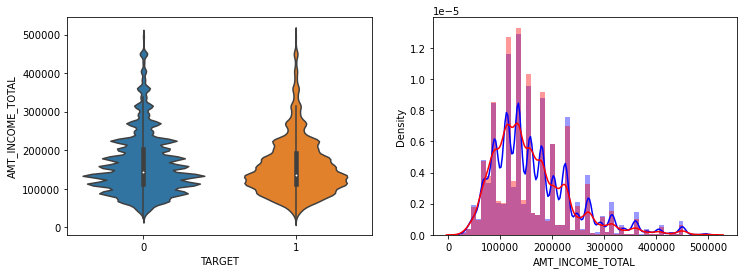

In [ ]:
def show_column_hist_by_target(df, column, is_amt=False):    
    cond1 = (df['TARGET'] == 1)
    cond0 = (df['TARGET'] == 0)

    fig, axs = plt.subplots(figsize=(12, 4), nrows=1, ncols=2, squeeze=False)
    # is_amt가 True이면 < 500000 조건으로 filtering
    cond_amt = True
    if is_amt:
        cond_amt = df[column] < 500000
    
    sns.violinplot(x='TARGET', y=column, data=df[cond_amt], ax=axs[0][0] )
    sns.distplot(df[cond0 & cond_amt][column], ax=axs[0][1], label='0', color='blue')
    sns.distplot(df[cond1 & cond_amt][column], ax=axs[0][1], label='1', color='red')

show_column_hist_by_target(app_train, 'AMT_INCOME_TOTAL', is_amt=True)

### Preprocessing
#### app_train과 app_test를 합쳐서 한번에 데이터 preprocessing 수행.

In [ ]:
app_train.shape, app_test.shape

((307511, 122), (48744, 121))

In [ ]:
# pandas의 concat()을 이용하여 app_train과 app_test를 결합
apps = pd.concat([app_train, app_test])
apps.shape

(356255, 122)

In [ ]:
# app_train의 TARGET 값을 Null로 입력됨. 
apps['TARGET'].value_counts(dropna=False)

0.0    282686
NaN     48744
1.0     24825
Name: TARGET, dtype: int64

#### Object feature들을 Label Encoding
* pandas의 factorize()를 이용

In [ ]:
apps.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 356255 entries, 0 to 48743
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(66), int64(40), object(16)
memory usage: 334.3+ MB


In [ ]:
# Label 인코딩을 위해 object 유형의 컬럼만 추출 
object_columns = apps.dtypes[apps.dtypes == 'object'].index.tolist()

In [ ]:
object_columns

['NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'NAME_TYPE_SUITE',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'OCCUPATION_TYPE',
 'WEEKDAY_APPR_PROCESS_START',
 'ORGANIZATION_TYPE',
 'FONDKAPREMONT_MODE',
 'HOUSETYPE_MODE',
 'WALLSMATERIAL_MODE',
 'EMERGENCYSTATE_MODE']

In [ ]:
apps['CODE_GENDER']

0        M
1        F
2        M
3        F
4        M
        ..
48739    F
48740    F
48741    F
48742    M
48743    F
Name: CODE_GENDER, Length: 356255, dtype: object

In [ ]:
# pd.factorize()는 편리하게 Category 컬럼을 Label인코딩 수행. 
# pd.factorize(Category컬럼 Series)는 Label인코딩된 Series와 uniq한 Category값을 반환함. 
# [0]을 이용하여 Label인코딩 Series만 취함. 
apps['CODE_GENDER'] = pd.factorize(apps['CODE_GENDER'])[0]
apps['CODE_GENDER']

0        0
1        1
2        0
3        1
4        0
        ..
48739    1
48740    1
48741    1
48742    0
48743    1
Name: CODE_GENDER, Length: 356255, dtype: int64

In [ ]:
# object column을 한번에 Label 인코딩하자
# pd.factorize()는 한개의 컬럼만 Label 인코딩이 가능하므로 object형 컬럼들을 iteration하면서 변환 수행. 
for column in object_columns:
    apps[column] = pd.factorize(apps[column])[0]

In [ ]:
apps.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 356255 entries, 0 to 48743
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(66), int64(56)
memory usage: 334.3 MB


#### 결측치 처리

In [ ]:
apps.isnull().sum().head(100)

SK_ID_CURR                           0
TARGET                           48744
NAME_CONTRACT_TYPE                   0
CODE_GENDER                          0
FLAG_OWN_CAR                         0
FLAG_OWN_REALTY                      0
CNT_CHILDREN                         0
AMT_INCOME_TOTAL                     0
AMT_CREDIT                           0
AMT_ANNUITY                         36
AMT_GOODS_PRICE                    278
NAME_TYPE_SUITE                      0
NAME_INCOME_TYPE                     0
NAME_EDUCATION_TYPE                  0
NAME_FAMILY_STATUS                   0
NAME_HOUSING_TYPE                    0
REGION_POPULATION_RELATIVE           0
DAYS_BIRTH                           0
DAYS_EMPLOYED                        0
DAYS_REGISTRATION                    0
DAYS_ID_PUBLISH                      0
OWN_CAR_AGE                     235241
FLAG_MOBIL                           0
FLAG_EMP_PHONE                       0
FLAG_WORK_PHONE                      0
FLAG_CONT_MOBILE         

In [ ]:
# -999로 모든 컬럼들의 Null값 변환
# 
apps = apps.fillna(-999)

#### 학습 데이터와 테스트 데이터 다시 분리

In [ ]:
# app_test의 TARGET 컬럼은 원래 null이었는데 앞에서 fillna(-999)로 -999로 변환됨. 이를 추출함. 
app_train = apps[apps['TARGET'] != -999]
app_test = apps[apps['TARGET']== -999]
app_train.shape, app_test.shape

((307511, 122), (48744, 122))

In [ ]:
# app_test의 TARGET컬럼을 Drop
app_test = app_test.drop('TARGET', axis=1)

In [ ]:
app_test.shape

(48744, 121)

In [ ]:
app_test.dtypes

SK_ID_CURR                      int64
NAME_CONTRACT_TYPE              int64
CODE_GENDER                     int64
FLAG_OWN_CAR                    int64
FLAG_OWN_REALTY                 int64
                               ...   
AMT_REQ_CREDIT_BUREAU_DAY     float64
AMT_REQ_CREDIT_BUREAU_WEEK    float64
AMT_REQ_CREDIT_BUREAU_MON     float64
AMT_REQ_CREDIT_BUREAU_QRT     float64
AMT_REQ_CREDIT_BUREAU_YEAR    float64
Length: 121, dtype: object

#### 학습 데이터를 검증 데이터로 분리하고 LGBM Classifier로 학습 수행. 
* 피처용 데이터와 타겟 데이터 분리
* 학습용/검증용 데이터 세트 분리

In [ ]:
ftr_app = app_train.drop(['SK_ID_CURR', 'TARGET'], axis=1)
target_app = app_train['TARGET']

In [ ]:
from sklearn.model_selection import train_test_split

train_x, valid_x, train_y, valid_y = train_test_split(ftr_app, target_app, test_size=0.3, random_state=2021)
train_x.shape, valid_x.shape

((215257, 120), (92254, 120))

In [ ]:
from lightgbm import LGBMClassifier

clf = LGBMClassifier(
        n_jobs=-1,
        n_estimators=1000,
        learning_rate=0.02,
        num_leaves=32,
        subsample=0.8,
        max_depth=12,
        silent=-1,
        verbose=-1
        )

clf.fit(train_x, train_y, eval_set=[(train_x, train_y), (valid_x, valid_y)], 
eval_metric= 'auc', verbose= 100, early_stopping_rounds= 50)

Training until validation scores don't improve for 50 rounds
[100]	training's auc: 0.753149	training's binary_logloss: 0.249708	valid_1's auc: 0.740531	valid_1's binary_logloss: 0.253105
[200]	training's auc: 0.7723	training's binary_logloss: 0.242948	valid_1's auc: 0.751634	valid_1's binary_logloss: 0.24893
[300]	training's auc: 0.784721	training's binary_logloss: 0.238878	valid_1's auc: 0.755786	valid_1's binary_logloss: 0.247481
[400]	training's auc: 0.796331	training's binary_logloss: 0.235508	valid_1's auc: 0.756972	valid_1's binary_logloss: 0.247029
[500]	training's auc: 0.806504	training's binary_logloss: 0.232526	valid_1's auc: 0.757287	valid_1's binary_logloss: 0.246869
[600]	training's auc: 0.815748	training's binary_logloss: 0.229736	valid_1's auc: 0.757548	valid_1's binary_logloss: 0.246756
Early stopping, best iteration is:
[612]	training's auc: 0.816579	training's binary_logloss: 0.229435	valid_1's auc: 0.757631	valid_1's binary_logloss: 0.246736


LGBMClassifier(learning_rate=0.02, max_depth=12, n_estimators=1000,
               num_leaves=32, silent=-1, subsample=0.8, verbose=-1)

<AxesSubplot:title={'center':'Feature importance'}, xlabel='Feature importance', ylabel='Features'>

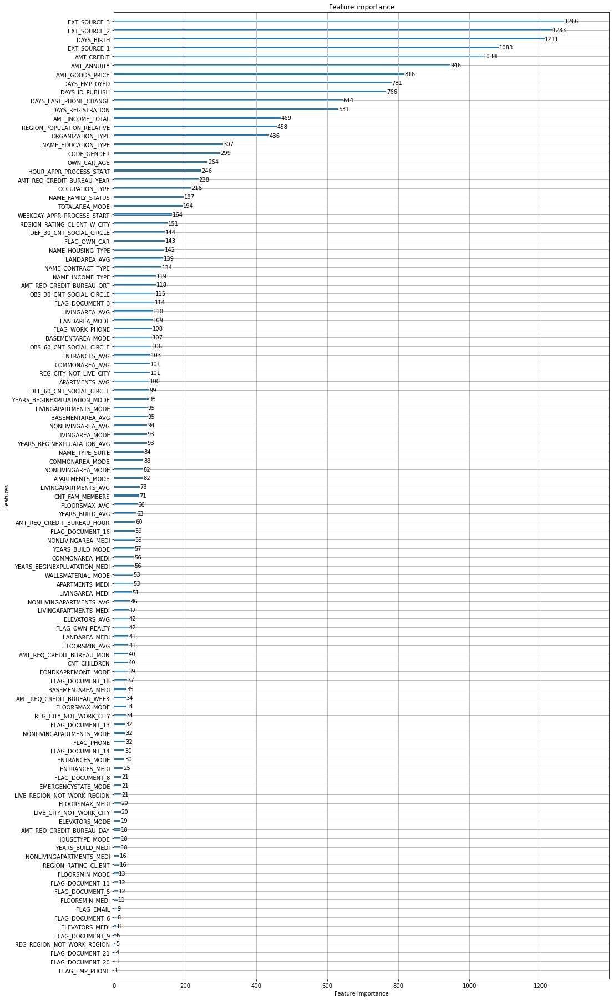

In [ ]:
# Feature Importance 시각화
from lightgbm import plot_importance

plot_importance(clf, figsize=(16, 32))

### 임시결론
* 데이터 Preprocessing 없이 가볍게 Lightgbm을 수행시키고 주요 Feature들을 확인하였습니다.
* 이를 baseline으로 해서 EDA부터 다시 시행해보고자 한다.

In [ ]:
# 주요 라이브러리 부터 다시 임포트
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import gc,os,sys
import random

from sklearn.model_selection import KFold, StratifiedKFold

import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 300)
pd.set_option('display.max_colwidth', 30)

In [ ]:
app_train = pd.read_csv('application_train.csv')
app_test = pd.read_csv('application_test.csv')

#### 연속형 숫자 feature들에 대해서 TARGET값이 각각 0과 1일때의 Histogram 시각화
* violinplot과 distplot으로 숫자형 feature들에 대해 TARGET값 별 분포도 비교 시각화
* 주요 Feature(numeric)에 대해서만 시각화

In [ ]:
def show_hist_by_target(df, column):
    cond_1 = (df['TARGET'] ==1)
    cond_0 = (df['TARGET'] ==0)

    for column in columns:
        print('column names:', column)
        fig,axs = plt.subplots(figsize=(12,4), nrows=1, ncols=2, squeeze=False)
        sns.violinplot(x='TARGET', y=column, data=df, ax=axs[0][0])
        sns.distplot(df[cond_1][column], label='1', color='red', ax=axs[0][1])
        sns.distplot(df[cond_0][column], label='1', color='blue', ax=axs[0][1])



column names: AMT_INCOME_TOTAL
column names: AMT_CREDIT
column names: AMT_ANNUITY
column names: AMT_GOODS_PRICE
column names: DAYS_BIRTH
column names: DAYS_EMPLOYED
column names: DAYS_ID_PUBLISH
column names: DAYS_REGISTRATION
column names: DAYS_LAST_PHONE_CHANGE
column names: CNT_FAM_MEMBERS
column names: REGION_RATING_CLIENT
column names: EXT_SOURCE_1
column names: EXT_SOURCE_2
column names: EXT_SOURCE_3
column names: AMT_REQ_CREDIT_BUREAU_HOUR
column names: AMT_REQ_CREDIT_BUREAU_DAY
column names: AMT_REQ_CREDIT_BUREAU_WEEK
column names: AMT_REQ_CREDIT_BUREAU_MON
column names: AMT_REQ_CREDIT_BUREAU_QRT
column names: AMT_REQ_CREDIT_BUREAU_YEAR


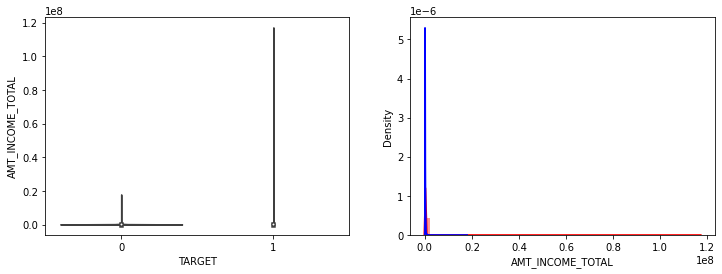

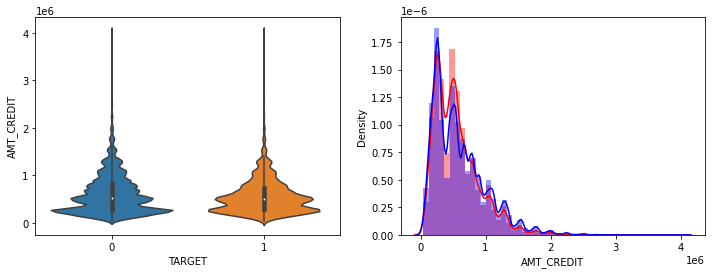

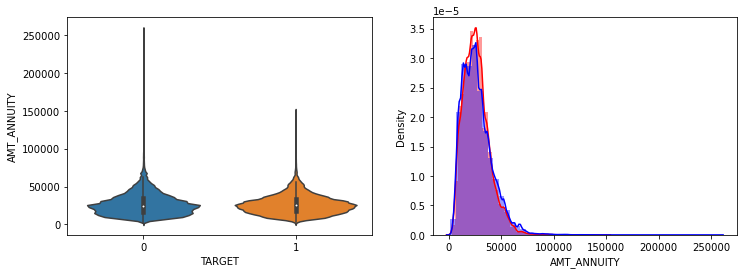

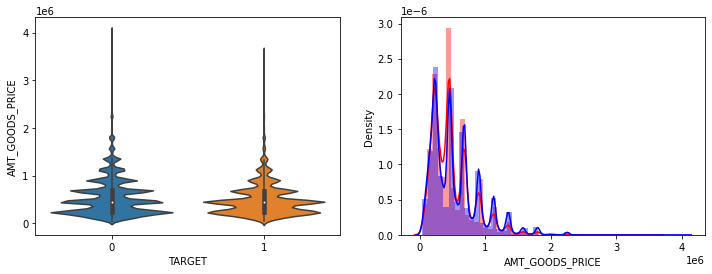

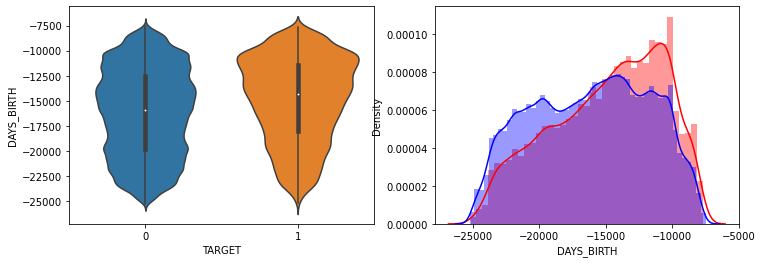

...

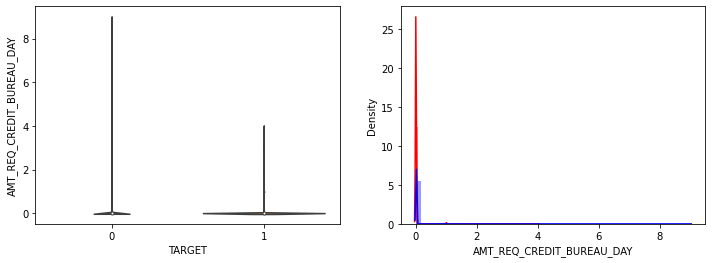

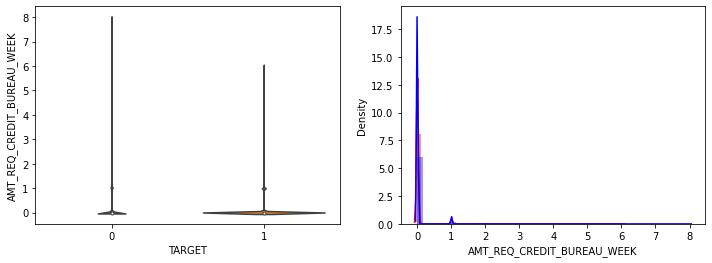

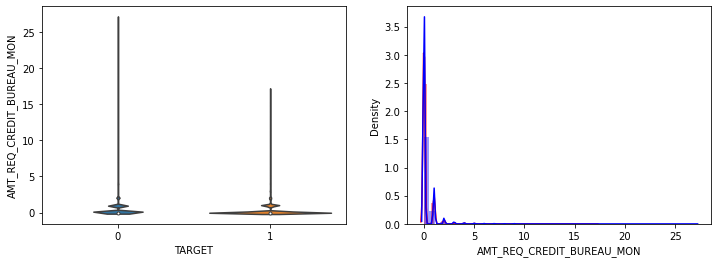

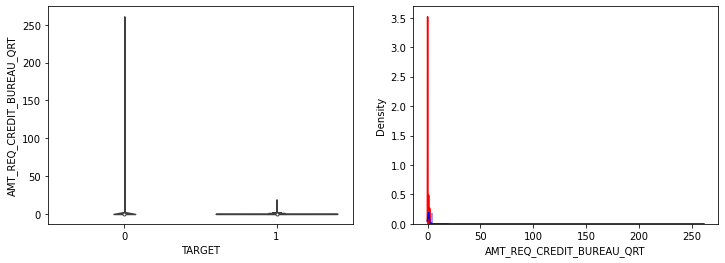

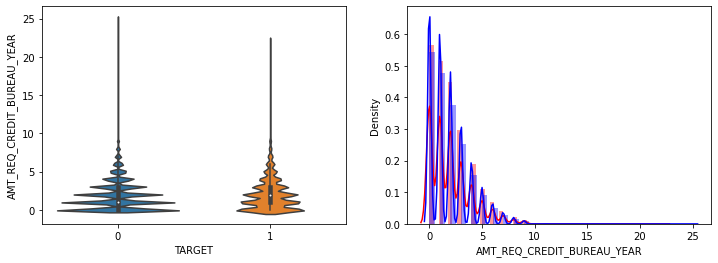

In [ ]:
columns = ['AMT_INCOME_TOTAL','AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_ID_PUBLISH',
           'DAYS_REGISTRATION', 'DAYS_LAST_PHONE_CHANGE', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT', 'EXT_SOURCE_1', 
           'EXT_SOURCE_2', 'EXT_SOURCE_3', 'AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK', 
           'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT', 'AMT_REQ_CREDIT_BUREAU_YEAR']

show_hist_by_target(app_train, columns)

* AMT_INCOME_TOTAL, AMT_CREDIT 은 크게 차이가 없음. 
* AMT_ANNUITY는 TARGET=1시 상대적으로 작은 숫자대의 값이 조금 많음. 
* AMT_GOOD_PRICE는 크게 차이가 없음. 
* DAYS_BIRTH는 TARGET=1시 적은 연령대의 숫자값이 상대적으로 많음. 
* DAYS_EMPLOYED는 TARGET=1시 작은 값들이 조금 더 많음. 
* DAYS_ID_PUBLISH, DAYS_REGISTRATION  는 TARGET=1시 최근 값들이 조금 더 많음. 
* DAYS_LAST_PHONE_CHANGE는 큰 차이 없음. 
* CNT_FAM_MEMBERS는 차이가 없음. outlier 때문에 histogram에 차이가 있어 보임. 
* REGION_RATING_CLIENT는 큰 차이 없음 
* EXT_SOURCE_1,EXT_SOURCE_2, EXT_SOURCE_3 모두 조금씩 차이가 있음.  
* 나머지 컬럼모두 큰 차이가 없음. 
* 전반적으로 연령대가 낮은(직장 경력이 적은), 소액 대출에서 상대적으로 연체 비중이 높음.  

#### seaborn의 countplot() 또는 catplot()을 이용하여 category 피처(object 컬럼)을 TARGET 유형에 따라 Count 비교

In [ ]:
object_columns = app_train.dtypes[app_train.dtypes=='object'].index.tolist()
object_columns

['NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'NAME_TYPE_SUITE',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'OCCUPATION_TYPE',
 'WEEKDAY_APPR_PROCESS_START',
 'ORGANIZATION_TYPE',
 'FONDKAPREMONT_MODE',
 'HOUSETYPE_MODE',
 'WALLSMATERIAL_MODE',
 'EMERGENCYSTATE_MODE']

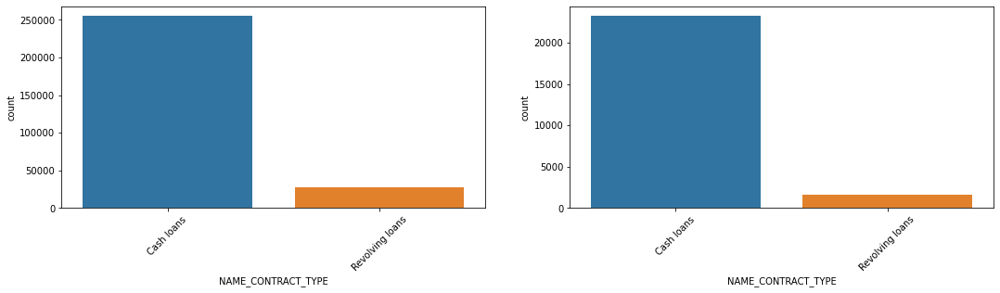

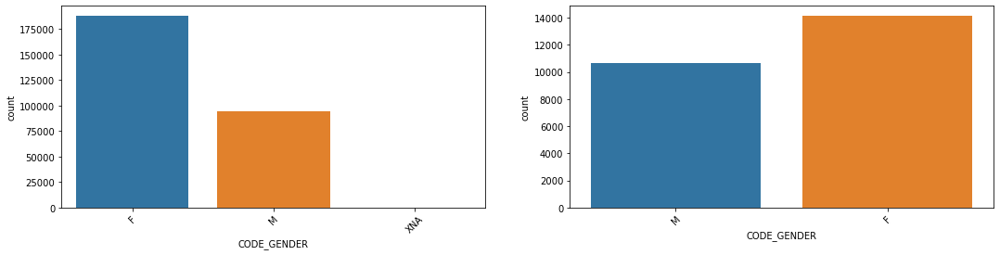

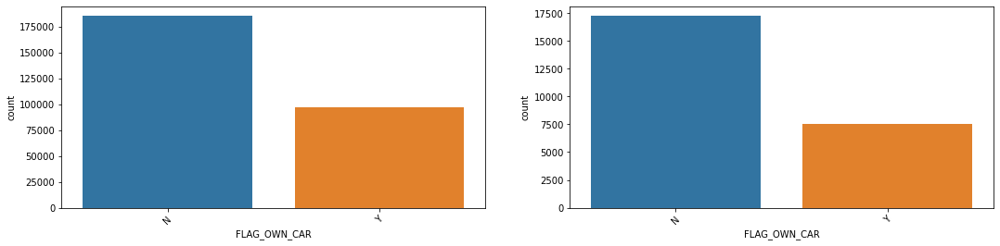

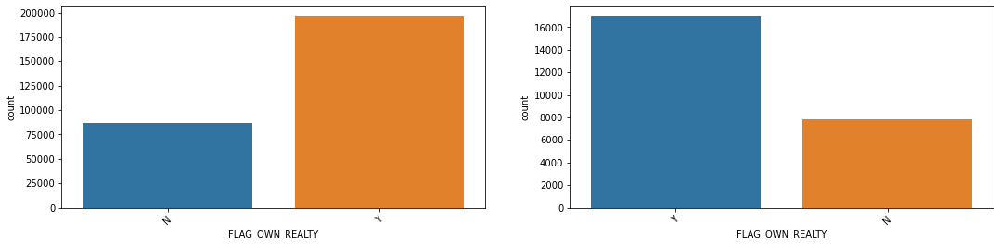

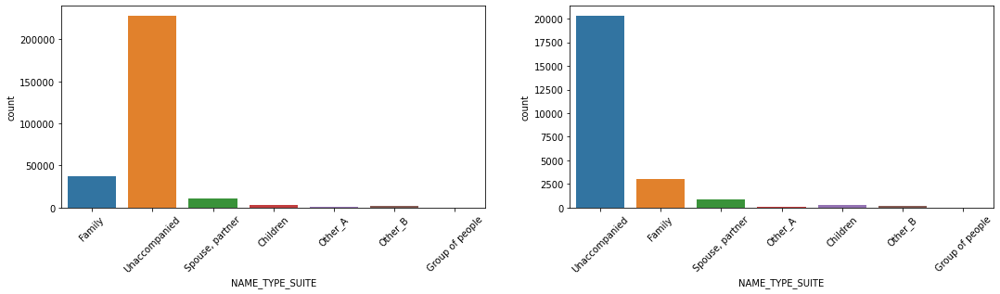

...

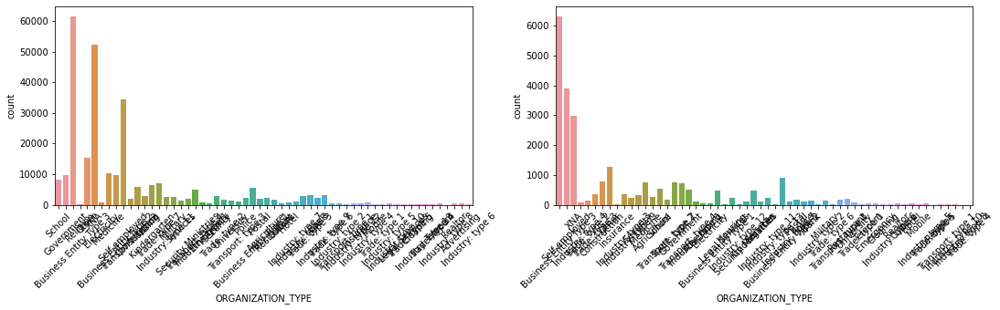

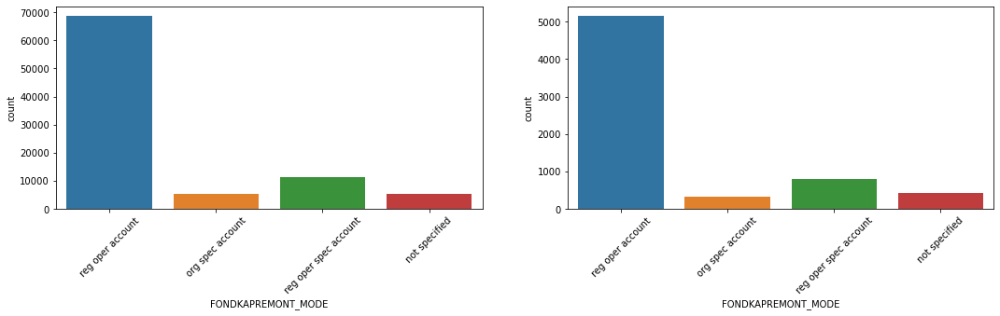

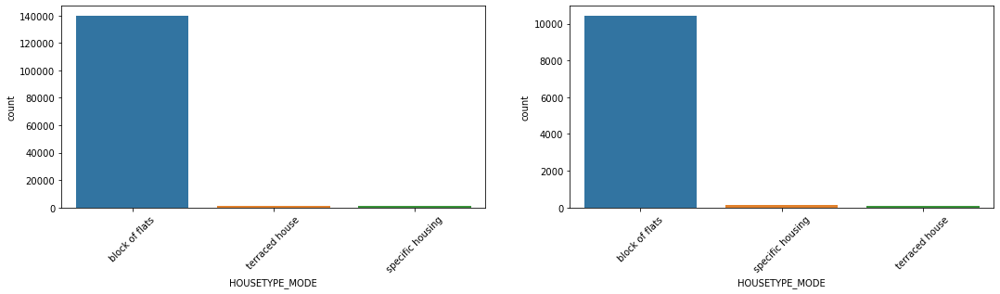

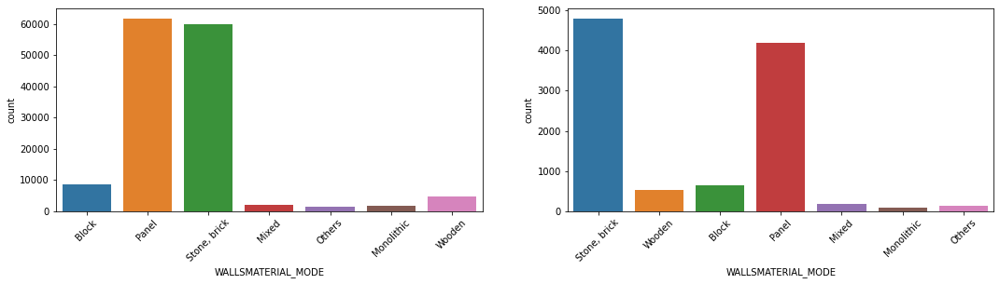

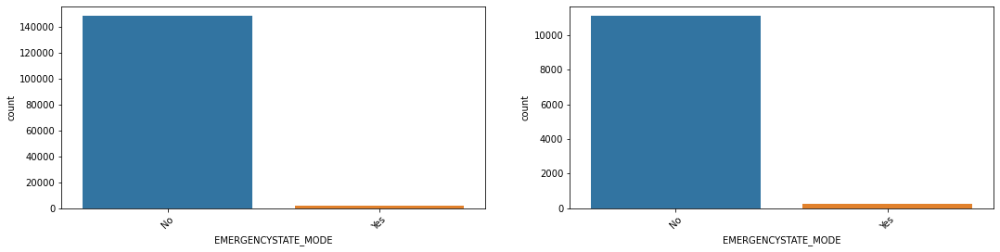

In [ ]:
def show_count_by_target(df, columns):
    cond_1 = (df['TARGET'] == 1)
    cond_0 = (df['TARGET'] == 0)
    
    for column in columns:
        fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(18, 4), squeeze=False)
        # countplot을 이용하여 category값의 histogram 표현
        chart0 = sns.countplot(df[cond_0][column], ax=axs[0][0])
        # x축의 tick label들이 값 유형이 많으므로 45도로 회전하여 표현
        chart0.set_xticklabels(chart0.get_xticklabels(), rotation=45)
        chart1 = sns.countplot(df[cond_1][column], ax=axs[0][1])
        chart1.set_xticklabels(chart1.get_xticklabels(), rotation=45)

        
show_count_by_target(app_train, object_columns)

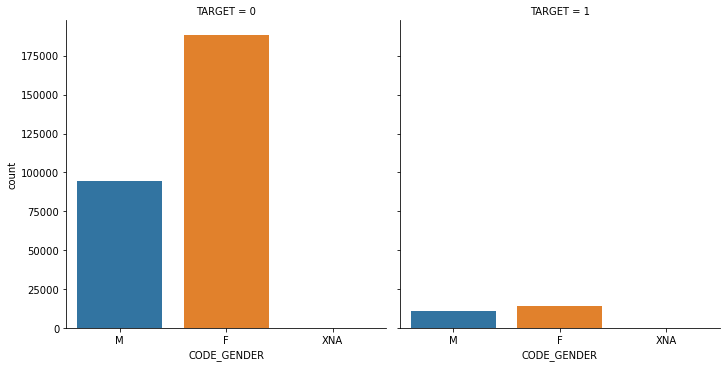

In [ ]:
# countplot은 각 plot마다 같은 feature value임에도 색이 다르다
# catplot을 이용하여 문제를 해결하자
# catplot을 이용하여 countplot을 특정 컬럼 값 조건에 따라 여러개의 subplot을 분리하여 보여줌.  
sns.catplot(x="CODE_GENDER",col="TARGET", data=app_train, kind="count")

column names : NAME_CONTRACT_TYPE
column names : CODE_GENDER
column names : FLAG_OWN_CAR
column names : FLAG_OWN_REALTY
column names : NAME_TYPE_SUITE
column names : NAME_INCOME_TYPE
column names : NAME_EDUCATION_TYPE
column names : NAME_FAMILY_STATUS
column names : NAME_HOUSING_TYPE
column names : OCCUPATION_TYPE
column names : WEEKDAY_APPR_PROCESS_START
column names : ORGANIZATION_TYPE
column names : FONDKAPREMONT_MODE
column names : HOUSETYPE_MODE
column names : WALLSMATERIAL_MODE
column names : EMERGENCYSTATE_MODE


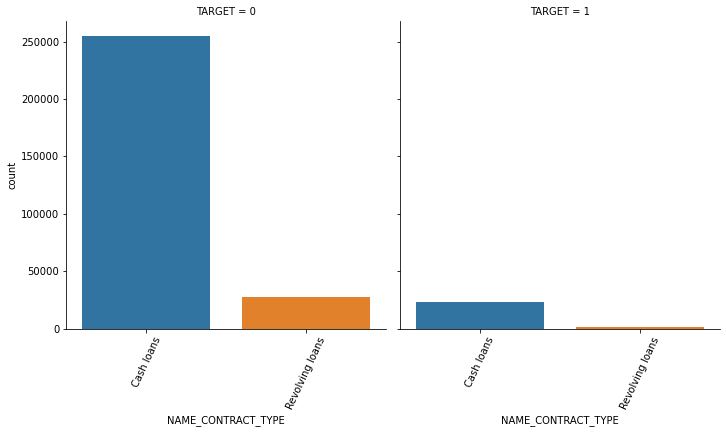

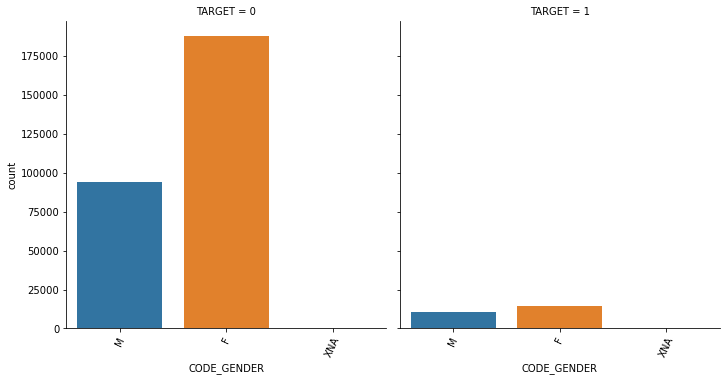

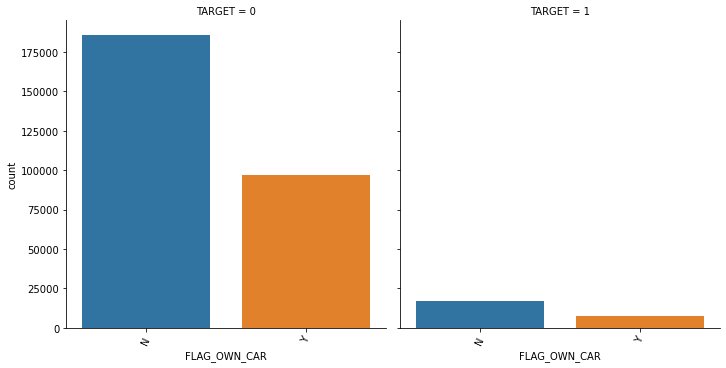

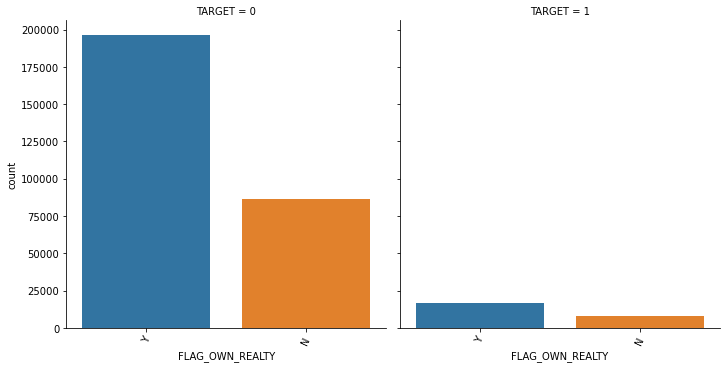

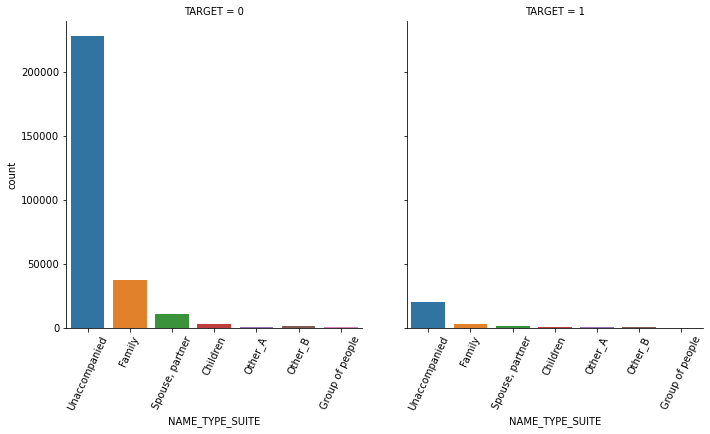

...

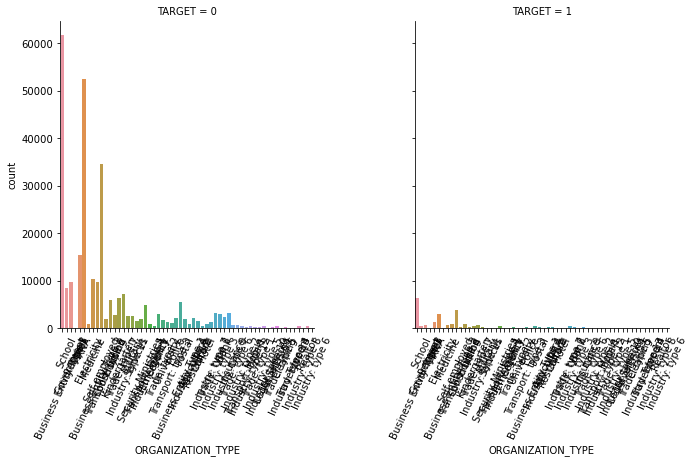

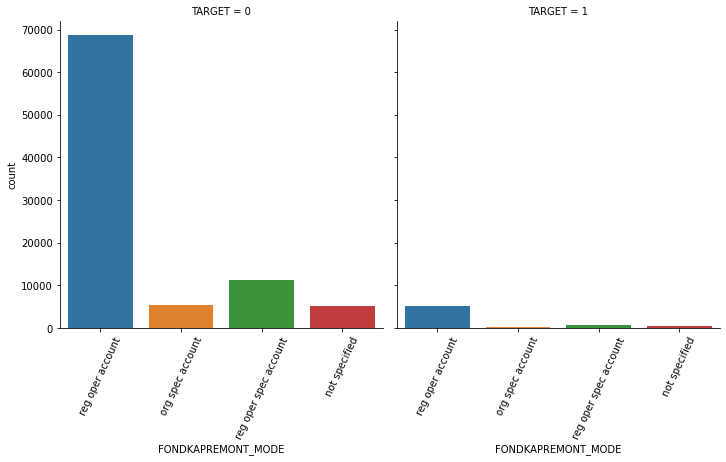

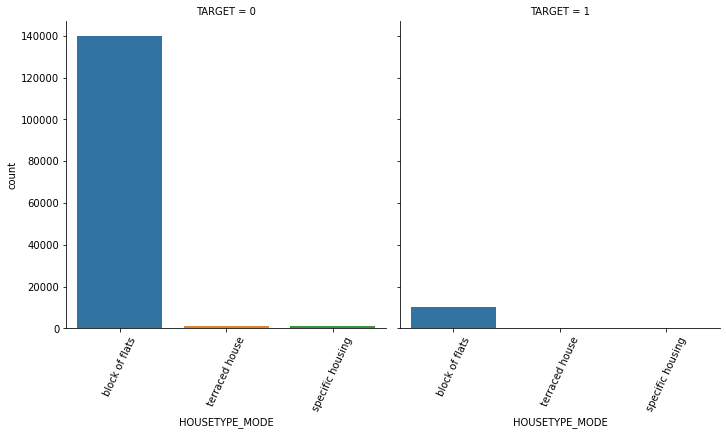

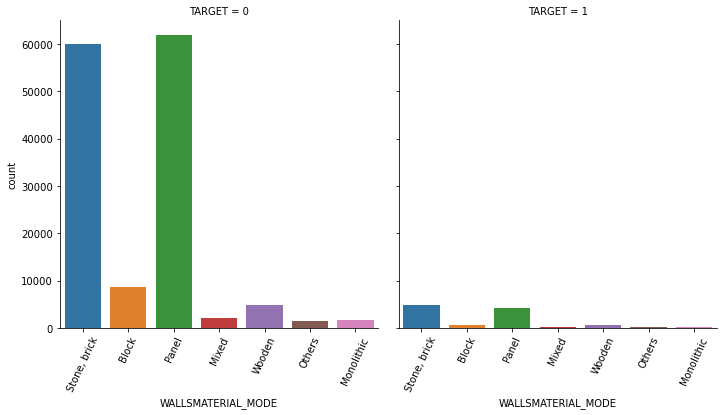

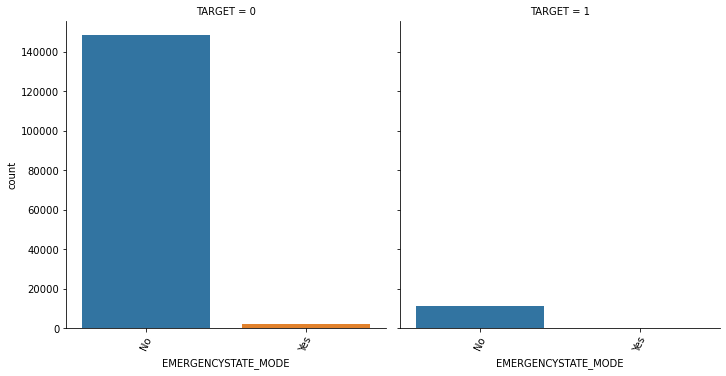

In [ ]:
# catplot을 이용하여 TARGET별로 여러컬럼의 category 값 Histogram을 표현.
def show_category_by_target(df, columns):
    for column in columns:
        print('column names :', column)
        chart = sns.catplot(x=column, col="TARGET", data=df, kind="count")
        # X축의 feature name들이 겹쳐지지 않게 65도 정도 회전
        chart.set_xticklabels(rotation=65)
        
show_category_by_target(app_train, object_columns)

In [ ]:
# 대출 횟수 대비 연체 비율이 남성이 여성보다 높음. 이를 value_counts()로 확인.
cond_1 = (app_train['TARGET'] == 1)
cond_0 = (app_train['TARGET'] == 0)
cond_f = (app_train['CODE_GENDER'] == 'F')
cond_m = (app_train['CODE_GENDER'] == 'M')

# 전체 건수 대비 남성과 여성의 비율 확인
print(app_train['CODE_GENDER'].value_counts()/app_train.shape[0])
# TARGET=1 일 경우 남성과 여성의 비율 확인
print(app_train[cond_1]['CODE_GENDER'].value_counts()/app_train[cond_1].shape[0])
# TARGET=0 일 경우 남성과 여성의 비율 확인
print(app_train[cond_0]['CODE_GENDER'].value_counts()/app_train[cond_0].shape[0])

F      0.658344
M      0.341643
XNA    0.000013
Name: CODE_GENDER, dtype: float64
F    0.570796
M    0.429204
Name: CODE_GENDER, dtype: float64
F      0.666032
M      0.333954
XNA    0.000014
Name: CODE_GENDER, dtype: float64


#### 주요 컬럼들의 target과의 상관도 분석(heatmap)

<AxesSubplot:>

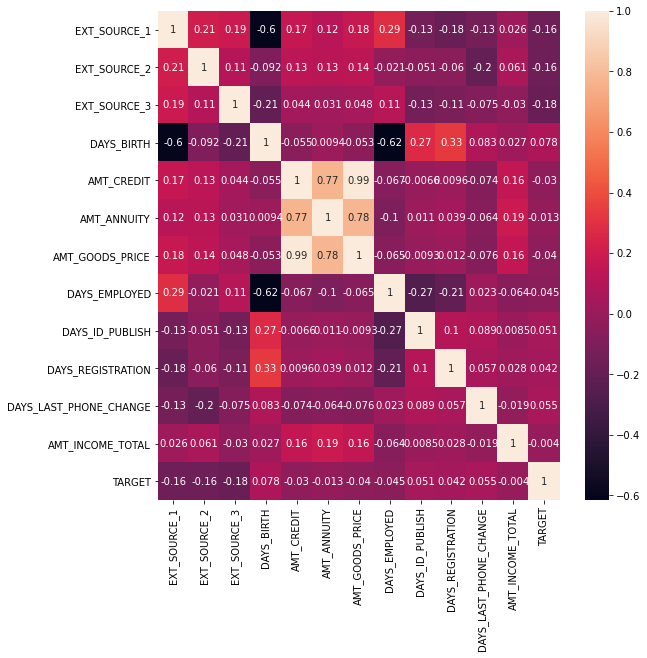

In [ ]:
corr_columns = ['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'DAYS_BIRTH', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE',
               'DAYS_EMPLOYED','DAYS_ID_PUBLISH', 'DAYS_REGISTRATION', 'DAYS_LAST_PHONE_CHANGE', 'AMT_INCOME_TOTAL', 'TARGET']

corr = app_train[corr_columns].corr()

plt.figure(figsize=(9, 9))
sns.heatmap(corr, annot=True)

#### 이상치 데이터 확인 및 DAYS_EMPLOYED 이상치 값 변경 

In [ ]:
### 365243이 매우 많음. 약 1000년치에 해당하는 날짜(이상치)
app_train['DAYS_EMPLOYED'].value_counts()

 365243    55374
-200         156
-224         152
-230         151
-199         151
           ...  
-11060         1
-10409         1
-10155         1
-11948         1
-12341         1
Name: DAYS_EMPLOYED, Length: 12574, dtype: int64

In [ ]:
# CODE_GENDER의 경우 XNA가 4건 정도. 많지 않으므로 그대로 유지 
app_train['CODE_GENDER'].value_counts()

F      202448
M      105059
XNA         4
Name: CODE_GENDER, dtype: int64

In [ ]:
# LightGBM은 NULL값을 트리 모델 생성하는데 사용할 수 있으므로 일괄적으로 Null로 변환 
app_train['DAYS_EMPLOYED'] = app_train['DAYS_EMPLOYED'].replace(365243, np.nan)
app_train['DAYS_EMPLOYED'].value_counts(dropna=False)

 NaN        55374
-200.0        156
-224.0        152
-230.0        151
-199.0        151
            ...  
-9681.0         1
-13421.0        1
-9703.0         1
-11283.0        1
-13497.0        1
Name: DAYS_EMPLOYED, Length: 12574, dtype: int64

### 주요 Feature들에 대한 feature engineering 수행
#### EXT_SOURCE 계열값 확인, EXT_SOURCE_X 피처들의 평균/최대/최소/표준편차 확인 

In [ ]:
# 결측치 확인
app_train[['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']].isnull().sum()

EXT_SOURCE_1    173378
EXT_SOURCE_2       660
EXT_SOURCE_3     60965
dtype: int64

In [ ]:
app_train['EXT_SOURCE_1'].value_counts(dropna=False)

NaN         173378
0.546426         5
0.598469         5
0.622707         5
0.605152         5
             ...  
0.288500         1
0.807598         1
0.237983         1
0.412337         1
0.615170         1
Name: EXT_SOURCE_1, Length: 114585, dtype: int64

In [ ]:
app_train['EXT_SOURCE_2'].value_counts(dropna=False)

0.285898    721
NaN         660
0.262258    417
0.265256    343
0.159679    322
           ... 
0.009063      1
0.457284      1
0.017615      1
0.371661      1
0.064909      1
Name: EXT_SOURCE_2, Length: 119832, dtype: int64

In [ ]:
app_train['EXT_SOURCE_3'].value_counts(dropna=False)

NaN         60965
0.746300     1460
0.713631     1315
0.694093     1276
0.670652     1191
            ...  
0.028674        1
0.896010        1
0.858178        1
0.017506        1
0.028275        1
Name: EXT_SOURCE_3, Length: 815, dtype: int64

In [ ]:
# EXT_SOURCE_X 피처들의 평균/최대/최소/표준편차 확인 
print('### mean ###\n', app_train[['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']].mean())
print('### max ###\n',app_train[['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']].max())
print('### min ###\n',app_train[['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']].min())
print('### std ###\n',app_train[['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']].std())

### mean ###
 EXT_SOURCE_1    0.502130
EXT_SOURCE_2    0.514393
EXT_SOURCE_3    0.510853
dtype: float64
### max ###
 EXT_SOURCE_1    0.962693
EXT_SOURCE_2    0.855000
EXT_SOURCE_3    0.896010
dtype: float64
### min ###
 EXT_SOURCE_1    1.456813e-02
EXT_SOURCE_2    8.173617e-08
EXT_SOURCE_3    5.272652e-04
dtype: float64
### std ###
 EXT_SOURCE_1    0.211062
EXT_SOURCE_2    0.191060
EXT_SOURCE_3    0.194844
dtype: float64


#### 데이터 가공 전 학습과 테스트용 데이터 세트 결합

In [ ]:
apps = pd.concat([app_train, app_test])
print(apps.shape)

(356255, 122)


#### EXT_SOURCE_X FEATURE 가공
* EXT_SOURCE_X 피처들을 결합하여 평균과 표준 편차를 신규 생성. 

In [ ]:
# EXT_SOURCE_X 피처들을 결합하여 평균과 표준 편차를 신규 생성. 
apps['APPS_EXT_SOURCE_MEAN'] = apps[['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']].mean(axis=1)
apps['APPS_EXT_SOURCE_STD'] = apps[['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']].std(axis=1)
#apps[['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'APPS_EXT_SOURCE_MEAN', 'APPS_EXT_SOURCE_STD']].head(10)

In [ ]:
apps['APPS_EXT_SOURCE_STD'].isnull().sum()

40950

In [ ]:
# 새로 생성한 APPS_EXT_SOURCE_STD이 NULL일 경우 APPS_EXT_SOURCE_STD의 평균으로 일괄 변경. 
apps['APPS_EXT_SOURCE_STD'] = apps['APPS_EXT_SOURCE_STD'].fillna(apps['APPS_EXT_SOURCE_STD'].mean())
apps['APPS_EXT_SOURCE_STD'].isnull().sum()

0

#### AMT_CREDIT 비율로 Feature 가공

In [ ]:
# AMT_CREDIT(대출 금액)으로 대출과 관련된 금액 추가 가공. 
apps['APPS_ANNUITY_CREDIT_RATIO'] = apps['AMT_ANNUITY']/apps['AMT_CREDIT']
apps['APPS_GOODS_CREDIT_RATIO'] = apps['AMT_GOODS_PRICE']/apps['AMT_CREDIT']
apps['APPS_CREDIT_GOODS_DIFF'] = apps['AMT_CREDIT'] - apps['AMT_GOODS_PRICE']

#### AMT_INCOME_TOTAL 비율로 Feature 가공

In [ ]:
# AMT_INCOME_TOTAL 비율로 대출 금액 관련 피처 가공
apps['APPS_ANNUITY_INCOME_RATIO'] = apps['AMT_ANNUITY']/apps['AMT_INCOME_TOTAL']
apps['APPS_CREDIT_INCOME_RATIO'] = apps['AMT_CREDIT']/apps['AMT_INCOME_TOTAL']
apps['APPS_GOODS_INCOME_RATIO'] = apps['AMT_GOODS_PRICE']/apps['AMT_INCOME_TOTAL']
# 가족수를 고려한 가처분 소득 피처 가공. 
apps['APPS_CNT_FAM_INCOME_RATIO'] = apps['AMT_INCOME_TOTAL']/apps['CNT_FAM_MEMBERS']

#### DAYS_BIRTH, DAYS_EMPLOYED 비율로 Feature 가공.

In [ ]:
# DAYS_BIRTH, DAYS_EMPLOYED 비율로 소득/자산 관련 Feature 가공. 
apps['APPS_EMPLOYED_BIRTH_RATIO'] = apps['DAYS_EMPLOYED']/apps['DAYS_BIRTH']
apps['APPS_INCOME_EMPLOYED_RATIO'] = apps['AMT_INCOME_TOTAL']/apps['DAYS_EMPLOYED']
apps['APPS_INCOME_BIRTH_RATIO'] = apps['AMT_INCOME_TOTAL']/apps['DAYS_BIRTH']
apps['APPS_CAR_BIRTH_RATIO'] = apps['OWN_CAR_AGE'] / apps['DAYS_BIRTH']
apps['APPS_CAR_EMPLOYED_RATIO'] = apps['OWN_CAR_AGE'] / apps['DAYS_EMPLOYED']


#### 데이터 레이블 인코딩, NULL값은 LightGBM 내부에서 처리하도록 특별한 변경하지 않음. 

In [ ]:
object_columns = apps.dtypes[apps.dtypes == 'object'].index.tolist()
for column in object_columns:
    apps[column] = pd.factorize(apps[column])[0]

apps.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 356255 entries, 0 to 48743
Columns: 136 entries, SK_ID_CURR to APPS_CAR_EMPLOYED_RATIO
dtypes: float64(81), int64(55)
memory usage: 372.4 MB


#### 학습 데이터와 테스트 데이터 다시 분리

In [ ]:
apps_train = apps[~apps['TARGET'].isnull()]
apps_test = apps[apps['TARGET'].isnull()]

apps_test = apps_test.drop('TARGET', axis=1)

#### 학습 데이터를 검증 데이터로 분리하고 LGBM Classifier로 학습 수행. 

In [ ]:
from sklearn.model_selection import train_test_split

ftr_app = apps_train.drop(['SK_ID_CURR', 'TARGET'], axis=1)
target_app = app_train['TARGET']

train_x, valid_x, train_y, valid_y = train_test_split(ftr_app, target_app, test_size=0.3, random_state=2021)
train_x.shape, valid_x.shape

((215257, 134), (92254, 134))

In [ ]:
from lightgbm import LGBMClassifier

clf = LGBMClassifier(
        n_jobs=-1,
        n_estimators=1000,
        learning_rate=0.02,
        num_leaves=32,
        subsample=0.8,
        max_depth=12,
        silent=-1,
        verbose=-1
        )

clf.fit(train_x, train_y, eval_set=[(train_x, train_y), (valid_x, valid_y)], eval_metric= 'auc', verbose= 100, 
        early_stopping_rounds= 100)


Training until validation scores don't improve for 100 rounds
[100]	training's auc: 0.759928	training's binary_logloss: 0.247073	valid_1's auc: 0.748989	valid_1's binary_logloss: 0.250541
[200]	training's auc: 0.780716	training's binary_logloss: 0.240017	valid_1's auc: 0.759834	valid_1's binary_logloss: 0.246548
[300]	training's auc: 0.79523	training's binary_logloss: 0.235347	valid_1's auc: 0.76416	valid_1's binary_logloss: 0.245088
[400]	training's auc: 0.80741	training's binary_logloss: 0.231545	valid_1's auc: 0.766056	valid_1's binary_logloss: 0.244437
[500]	training's auc: 0.817543	training's binary_logloss: 0.228327	valid_1's auc: 0.766691	valid_1's binary_logloss: 0.244215
[600]	training's auc: 0.826604	training's binary_logloss: 0.225323	valid_1's auc: 0.766923	valid_1's binary_logloss: 0.244104
[700]	training's auc: 0.83524	training's binary_logloss: 0.222432	valid_1's auc: 0.767104	valid_1's binary_logloss: 0.244014
[800]	training's auc: 0.842682	training's binary_logloss: 0.

LGBMClassifier(learning_rate=0.02, max_depth=12, n_estimators=1000,
               num_leaves=32, silent=-1, subsample=0.8, verbose=-1)

#### 결과분석
* feature engineering이전의 AUC 값(0.757631)
* feature engineering이후의 AUC 값(0.767598)
* 결과가 좋아졌다는 사실을 알 수 있다.

<AxesSubplot:title={'center':'Feature importance'}, xlabel='Feature importance', ylabel='Features'>

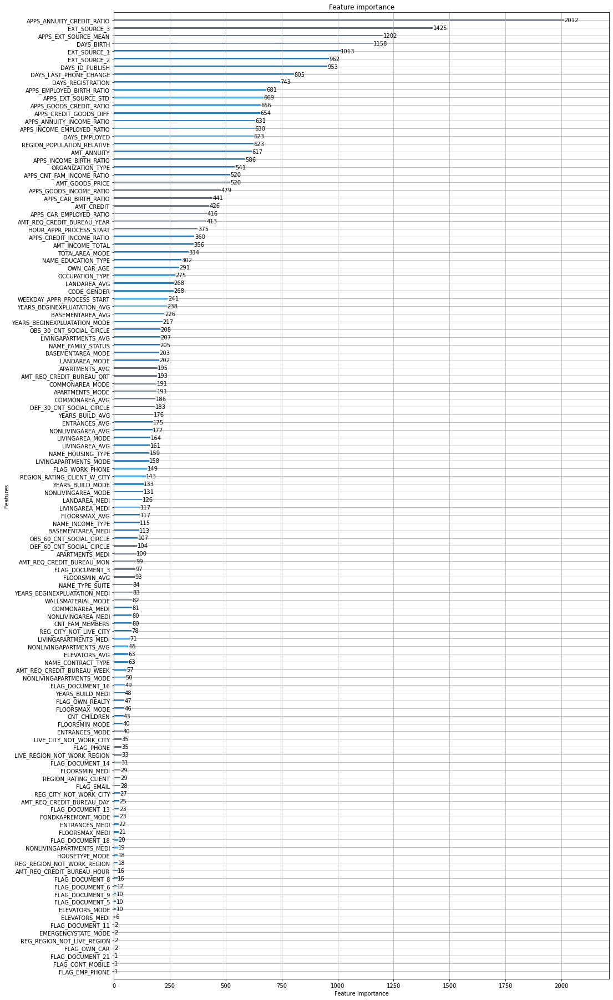

In [ ]:
from lightgbm import plot_importance

plot_importance(clf, figsize=(16, 32))

In [ ]:
#### application 데이터 세트 feature engineering을 함수화

def get_apps_processed(apps):
    
    # EXT_SOURCE_X FEATURE 가공
    apps['APPS_EXT_SOURCE_MEAN'] = apps[['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']].mean(axis=1)
    apps['APPS_EXT_SOURCE_STD'] = apps[['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']].std(axis=1)
    apps['APPS_EXT_SOURCE_STD'] = apps['APPS_EXT_SOURCE_STD'].fillna(apps['APPS_EXT_SOURCE_STD'].mean())
      
    # AMT_CREDIT 비율로 Feature 가공
    apps['APPS_ANNUITY_CREDIT_RATIO'] = apps['AMT_ANNUITY']/apps['AMT_CREDIT']
    apps['APPS_GOODS_CREDIT_RATIO'] = apps['AMT_GOODS_PRICE']/apps['AMT_CREDIT']
    
    # AMT_INCOME_TOTAL 비율로 Feature 가공
    apps['APPS_ANNUITY_INCOME_RATIO'] = apps['AMT_ANNUITY']/apps['AMT_INCOME_TOTAL']
    apps['APPS_CREDIT_INCOME_RATIO'] = apps['AMT_CREDIT']/apps['AMT_INCOME_TOTAL']
    apps['APPS_GOODS_INCOME_RATIO'] = apps['AMT_GOODS_PRICE']/apps['AMT_INCOME_TOTAL']
    apps['APPS_CNT_FAM_INCOME_RATIO'] = apps['AMT_INCOME_TOTAL']/apps['CNT_FAM_MEMBERS']
    
    # DAYS_BIRTH, DAYS_EMPLOYED 비율로 Feature 가공
    apps['APPS_EMPLOYED_BIRTH_RATIO'] = apps['DAYS_EMPLOYED']/apps['DAYS_BIRTH']
    apps['APPS_INCOME_EMPLOYED_RATIO'] = apps['AMT_INCOME_TOTAL']/apps['DAYS_EMPLOYED']
    apps['APPS_INCOME_BIRTH_RATIO'] = apps['AMT_INCOME_TOTAL']/apps['DAYS_BIRTH']
    apps['APPS_CAR_BIRTH_RATIO'] = apps['OWN_CAR_AGE'] / apps['DAYS_BIRTH']
    apps['APPS_CAR_EMPLOYED_RATIO'] = apps['OWN_CAR_AGE'] / apps['DAYS_EMPLOYED']
       
    return apps

    `bbb`

In [ ]:
# 사이킷런 - encoders & imputers
from category_encoders import TargetEncoder
from sklearn.impute import SimpleImputer, KNNImputer

# 사이킷런 - 파이프라인
from sklearn.pipeline import make_pipeline

# 사이킷런 - 학습모델
from sklearn.ensemble import RandomForestClassifier

# 사이킷런 - 모델 평가 지표
from sklearn.metrics import accuracy_score, mean_absolute_error, f1_score

# 
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV, validation_curve

In [ ]:
from IPython.display import Image

### 데이터셋의 구성
#### 데이터셋은 여러 단계로 구성되어 있다.
* application_train/test.csv(현재 대출)
* previous_application(과거 대출 이력)
* bureau.csv(타사 대출이력)
* bureau_balance.csv(타사 대출 월별 잔액)
* POS_CASH_balane.csv(현금 대출 잔액)
* credit_card_balance.csv(카드 대출 잔액)
* intalments_payments.csv(납부이력)

![model_structure](model_structure.jpg)

* preprevious_application은 과거 대출 이력이므로 중요한 정보이다
* 현재 데이터(application_train/test)에 합쳐주자.
* SK_ID_CURR을 기준으로 Groupby 시켜준다


### prev_application 데이터 세트 기반의 EDA와 Feature Engineering 수행 후 학습 모델 생성/평가

#### 라이브러리 및 데이터 세트 로딩. 이전 application 데이터의 FE 함수 복사

In [ ]:
import numpy as np
import pandas as pd
import gc
import time
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

pd.set_option('display.max_rows', 100)
pd.set_option('display.max_columns', 200)

app_train = pd.read_csv('application_train.csv')
app_test = pd.read_csv('application_test.csv')

In [ ]:
def get_apps_dataset():
    app_train = pd.read_csv('application_train.csv')
    app_test = pd.read_csv('application_test.csv')
    apps = pd.concat([app_train, app_test])
    
    return apps

apps = get_apps_dataset()

In [ ]:
# 이전 application 데이터의 feature engineering 함수 복사

def get_apps_processed(apps):
    
    # EXT_SOURCE_X FEATURE 가공
    apps['APPS_EXT_SOURCE_MEAN'] = apps[['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']].mean(axis=1)
    apps['APPS_EXT_SOURCE_STD'] = apps[['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']].std(axis=1)
    apps['APPS_EXT_SOURCE_STD'] = apps['APPS_EXT_SOURCE_STD'].fillna(apps['APPS_EXT_SOURCE_STD'].mean())
    
    # AMT_CREDIT 비율로 Feature 가공
    apps['APPS_ANNUITY_CREDIT_RATIO'] = apps['AMT_ANNUITY']/apps['AMT_CREDIT']
    apps['APPS_GOODS_CREDIT_RATIO'] = apps['AMT_GOODS_PRICE']/apps['AMT_CREDIT']
    
    # AMT_INCOME_TOTAL 비율로 Feature 가공
    apps['APPS_ANNUITY_INCOME_RATIO'] = apps['AMT_ANNUITY']/apps['AMT_INCOME_TOTAL']
    apps['APPS_CREDIT_INCOME_RATIO'] = apps['AMT_CREDIT']/apps['AMT_INCOME_TOTAL']
    apps['APPS_GOODS_INCOME_RATIO'] = apps['AMT_GOODS_PRICE']/apps['AMT_INCOME_TOTAL']
    apps['APPS_CNT_FAM_INCOME_RATIO'] = apps['AMT_INCOME_TOTAL']/apps['CNT_FAM_MEMBERS']
    
    # DAYS_BIRTH, DAYS_EMPLOYED 비율로 Feature 가공
    apps['APPS_EMPLOYED_BIRTH_RATIO'] = apps['DAYS_EMPLOYED']/apps['DAYS_BIRTH']
    apps['APPS_INCOME_EMPLOYED_RATIO'] = apps['AMT_INCOME_TOTAL']/apps['DAYS_EMPLOYED']
    apps['APPS_INCOME_BIRTH_RATIO'] = apps['AMT_INCOME_TOTAL']/apps['DAYS_BIRTH']
    apps['APPS_CAR_BIRTH_RATIO'] = apps['OWN_CAR_AGE'] / apps['DAYS_BIRTH']
    apps['APPS_CAR_EMPLOYED_RATIO'] = apps['OWN_CAR_AGE'] / apps['DAYS_EMPLOYED']
    
    return apps

##### previous 데이터 로딩

In [ ]:
prev = pd.read_csv('previous_application.csv')
print(prev.shape, apps.shape)

(1670214, 37) (356255, 122)


##### application와 previous outer 조인하고 누락된 집합들 확인. 

### previous 컬럼 설명

|Table|컬럼명|컬럼 대분류|컬럼 중분류|컬럼 설명|
|------|--------|----|--------|-----------------|
|previous_application.csv|SK_ID_PREV |대출|고유ID|과거 대출 고유 ID|
|previous_application.csv|SK_ID_CURR|대출|고유ID|현재 대출 고유 ID|
|previous_application.csv|NAME_CONTRACT_TYPE|대출|대출 유형|대출 유형|
|previous_application.csv|AMT_ANNUITY|대출|대출 금액|월 대출 지급액|
|previous_application.csv|AMT_APPLICATION|대출|대출 금액|대출 신청 금액|
|previous_application.csv|AMT_CREDIT|대출|대출 금액|대출금액(허가)|
|previous_application.csv|AMT_DOWN_PAYMENT|대출|대출 금액|대출 시 납부한 선금액|
|previous_application.csv|AMT_GOODS_PRICE|대출|대출 금액|소비자 대출상품액|
|previous_application.csv|WEEKDAY_APPR_PROCESS_START|고객|행동|대출 신청 시작 요일|
|previous_application.csv|HOUR_APPR_PROCESS_START|고객|행동|대출 신청 시작 시간대|
|previous_application.csv|FLAG_LAST_APPL_PER_CONTRACT|고객|행동|이전 계약의 마지막 대출 신청 여부|
|previous_application.csv|NFLAG_LAST_APPL_IN_DAY|고객|행동|하루중 마지막 대출 신청 여부(하루에 여러 번 대출 신청했을 경우)|
|previous_application.csv|NFLAG_MICRO_CASH|대출|대출 유형|소액 대출 여부|
|previous_application.csv|RATE_DOWN_PAYMENT|대출|대출 금액|선금 비율(정규화됨)|
|previous_application.csv|RATE_INTEREST_PRIMARY|대출|대출 금액|이자율|
|previous_application.csv|RATE_INTEREST_PRIVILEGED|대출|대출 금액|이자율|
|previous_application.csv|NAME_CASH_LOAN_PURPOSE|대출|대출 유형|현금 대출 목적|
|previous_application.csv|NAME_CONTRACT_STATUS|대출|대출 상태|대출 상태(허가, 취소)|
|previous_application.csv|DAYS_DECISION|대출|대출 상태|과거 신청 대비 현재 신청 결정 기간|
|previous_application.csv|NAME_PAYMENT_TYPE|대출|대출 유형|과거 대출 신청의 납부 방법|
|previous_application.csv|CODE_REJECT_REASON|대출|대출 상태|과거 신청 거절 사유|
|previous_application.csv|NAME_TYPE_SUITE|고객|행동(추천)|동행 고객|
|previous_application.csv|NAME_CLIENT_TYPE|고객|행동|신규 고객 또는 기존 대출 고객 여부|
|previous_application.csv|NAME_GOODS_CATEGORY|대출|대출 유형|대출 상품 중분류 유형|
|previous_application.csv|NAME_PORTFOLIO|대출|대출 유형|현금대출/POS/CAR 대출 유형|
|previous_application.csv|NAME_PRODUCT_TYPE|채널|판매 유형|고객이 찾아온 대출인가, 영업 대출인가|
|previous_application.csv|CHANNEL_TYPE|채널|채널 유형|채널 유형|
|previous_application.csv|SELLERPLACE_AREA|채널|채널 유형|판매자 판매 지역|
|previous_application.csv|NAME_SELLER_INDUSTRY|채널|채널 유형|판매자 Industry|
|previous_application.csv|CNT_PAYMENT|대출|대출 금액|이전 대출 신청의 대출금액 관련 Term|
|previous_application.csv|NAME_YIELD_GROUP|대출|대출 금액|집단 금리 적용 유형|
|previous_application.csv|PRODUCT_COMBINATION|대출|대출 유형|이전 대출 결합 상품|
|previous_application.csv|DAYS_FIRST_DRAWING|대출|상태|신청날짜부터 최초 대출 지급까지의 일자|
|previous_application.csv|DAYS_FIRST_DUE|대출|상태|신청날짜부터 마감일까지의 일자|
|previous_application.csv|DAYS_LAST_DUE_1ST_VERSION|대출|상태|신청날짜부터 첫 만기일까지의 일자|
|previous_application.csv|DAYS_LAST_DUE|대출|상태|신청날짜부터 마지막 만기일까지의 일자|
|previous_application.csv|DAYS_TERMINATION|대출|상태|현 대출 신청일자 대비 대출 예상 종료 일자|
|previous_application.csv|NFLAG_INSURED_ON_APPROVAL|대출|상태|대출 신청 시 보험가입 요청여부|


In [ ]:
prev.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 37 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_PREV                   1670214 non-null  int64  
 1   SK_ID_CURR                   1670214 non-null  int64  
 2   NAME_CONTRACT_TYPE           1670214 non-null  object 
 3   AMT_ANNUITY                  1297979 non-null  float64
 4   AMT_APPLICATION              1670214 non-null  float64
 5   AMT_CREDIT                   1670213 non-null  float64
 6   AMT_DOWN_PAYMENT             774370 non-null   float64
 7   AMT_GOODS_PRICE              1284699 non-null  float64
 8   WEEKDAY_APPR_PROCESS_START   1670214 non-null  object 
 9   HOUR_APPR_PROCESS_START      1670214 non-null  int64  
 10  FLAG_LAST_APPL_PER_CONTRACT  1670214 non-null  object 
 11  NFLAG_LAST_APPL_IN_DAY       1670214 non-null  int64  
 12  RATE_DOWN_PAYMENT            774370 non-nu

### 주요 컬럼 EDA 수행

##### SK_ID_CURR당 평균 SK_ID_PREV 건수 구하기
* groupby 로 평균 건수 구함. 
* boxplot으로 시각화

In [ ]:
# SK_ID_CURR 로 groupby하여 평균 건수 구함. 
prev.groupby('SK_ID_CURR')['SK_ID_CURR'].count().mean()

4.928964135313716

C:\Users\channee\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='SK_ID_CURR'>

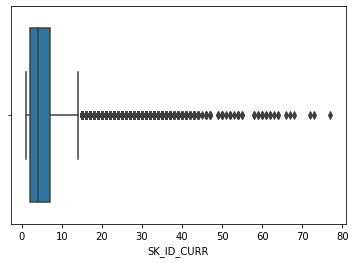

In [ ]:
# box plot으로 시각화. 일부 데이터는 특정 SK_ID_CURR로 몇십개의 데이터가 있음. 
sns.boxplot(prev.groupby('SK_ID_CURR')['SK_ID_CURR'].count())

#### 숫자형 피처들의 Histogram을 TARGET 유형에 따라 비교

* application_train의 TARGET 값을 가져오기 위해 prev와 app_train을 inner join 후 TARGET 유형에 따라 비교
* 숫자형 컬럼명 필터링

In [ ]:
# TARGET값을 application에서 가져오기 위해 조인. 
app_prev = prev.merge(app_train[['SK_ID_CURR', 'TARGET']], on='SK_ID_CURR', how='left')
app_prev.shape

(1670214, 38)

In [ ]:
def show_hist_by_target(df, columns):
    cond_1 = (df['TARGET'] == 1)
    cond_0 = (df['TARGET'] == 0)
    
    for column in columns:
        fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(12, 4), squeeze=False)
        sns.violinplot(x='TARGET', y=column, data=df, ax=axs[0][0] )
        sns.distplot(df[cond_0][column], ax=axs[0][1], label='0', color='blue')
        sns.distplot(df[cond_1][column], ax=axs[0][1], label='1', color='red')   

In [ ]:
num_columns = app_prev.dtypes[app_prev.dtypes != 'object'].index.tolist()
num_columns = [column for column in num_columns if column not in['SK_ID_PREV', 'SK_ID_CURR', 'TARGET']]
print(num_columns)

['AMT_ANNUITY', 'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE', 'HOUR_APPR_PROCESS_START', 'NFLAG_LAST_APPL_IN_DAY', 'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY', 'RATE_INTEREST_PRIVILEGED', 'DAYS_DECISION', 'SELLERPLACE_AREA', 'CNT_PAYMENT', 'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION', 'DAYS_LAST_DUE', 'DAYS_TERMINATION', 'NFLAG_INSURED_ON_APPROVAL']


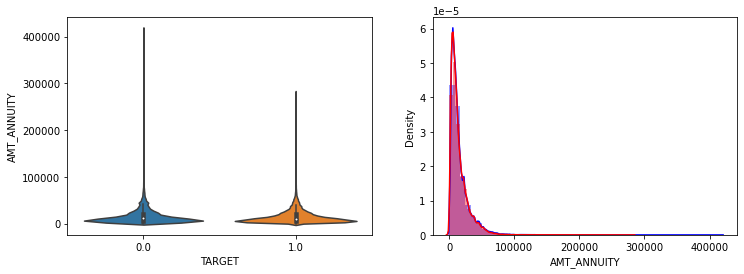

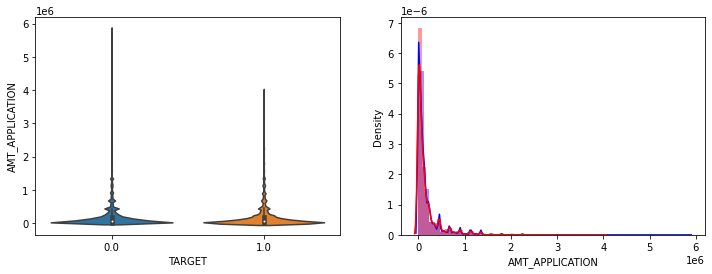

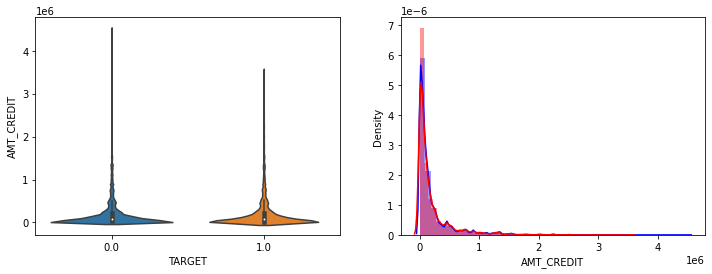

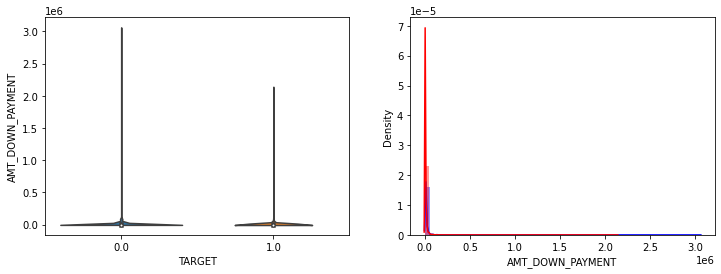

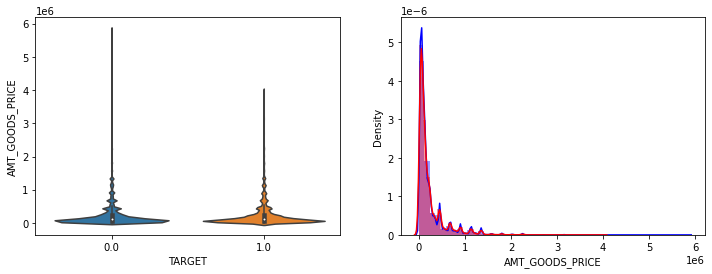

...

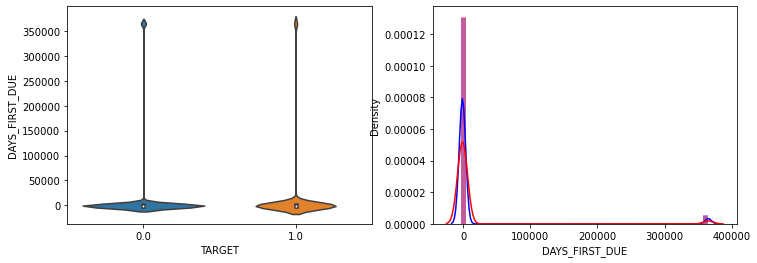

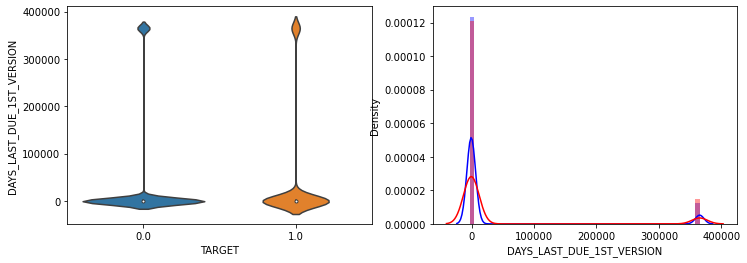

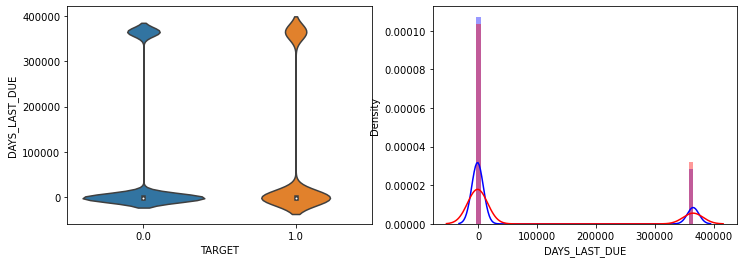

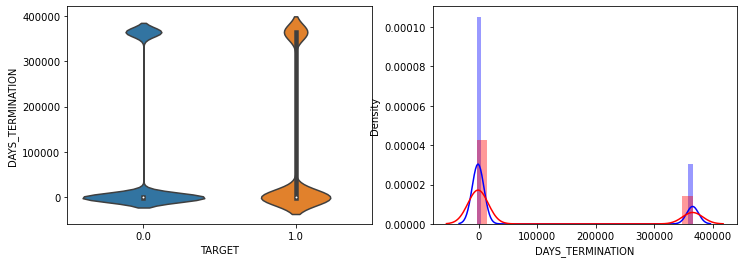

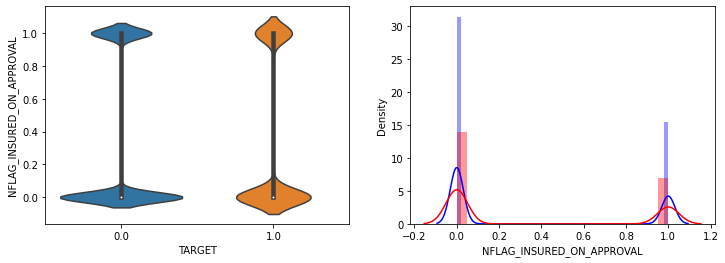

In [ ]:
import warnings

warnings.filterwarnings(action='ignore') 

show_hist_by_target(app_prev, num_columns)

* AMT_ANNUITY, AMT_CREDIT, AMT_APPLICATION, AMT_GOODS_CREDIT는 TARGET=1일 경우에 소액 비율이 약간 높음(큰 차이는 아님)
* RATE_DOWN_PAYMENT는 큰 차이 없음. 
* RATE_INTEREST_PRIMARY, RATE_INTEREST_PRIVILEGED 는 NULL값이 매우 많아서 판단 어려움
* DAYS_DECISION은 TARGET=1일 때 0에 가까운(최근일)값이 약간 더 많음. 
* DAYS_FIRST_DRAWING, DAYS_FIRST_DUE, DAYS_LAST_DUE_1ST_VERSION, DAYS_LAST_DUE, DAYS_TERMINATION은 365243 값이 매우 많음. 

#### Category 피처들의 Histogram을 TARGET 유형에 따라 비교

In [ ]:
object_columns = app_prev.dtypes[app_prev.dtypes=='object'].index.tolist()
object_columns

['NAME_CONTRACT_TYPE',
 'WEEKDAY_APPR_PROCESS_START',
 'FLAG_LAST_APPL_PER_CONTRACT',
 'NAME_CASH_LOAN_PURPOSE',
 'NAME_CONTRACT_STATUS',
 'NAME_PAYMENT_TYPE',
 'CODE_REJECT_REASON',
 'NAME_TYPE_SUITE',
 'NAME_CLIENT_TYPE',
 'NAME_GOODS_CATEGORY',
 'NAME_PORTFOLIO',
 'NAME_PRODUCT_TYPE',
 'CHANNEL_TYPE',
 'NAME_SELLER_INDUSTRY',
 'NAME_YIELD_GROUP',
 'PRODUCT_COMBINATION']

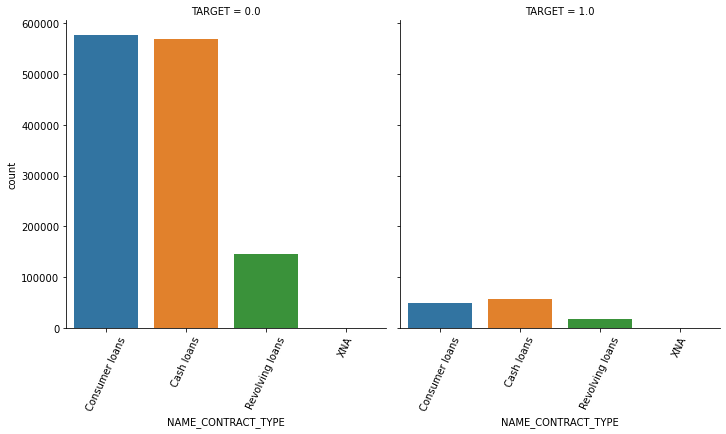

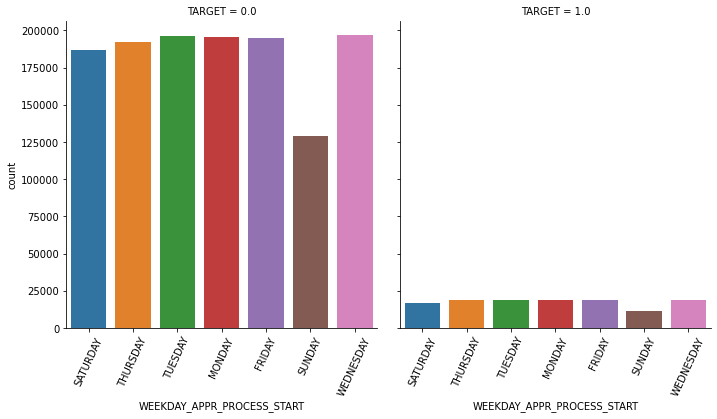

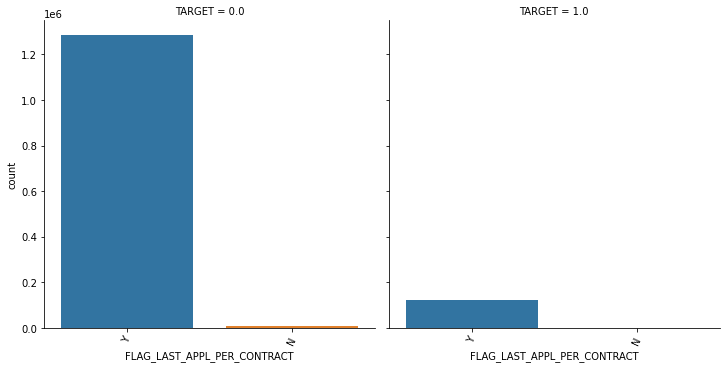

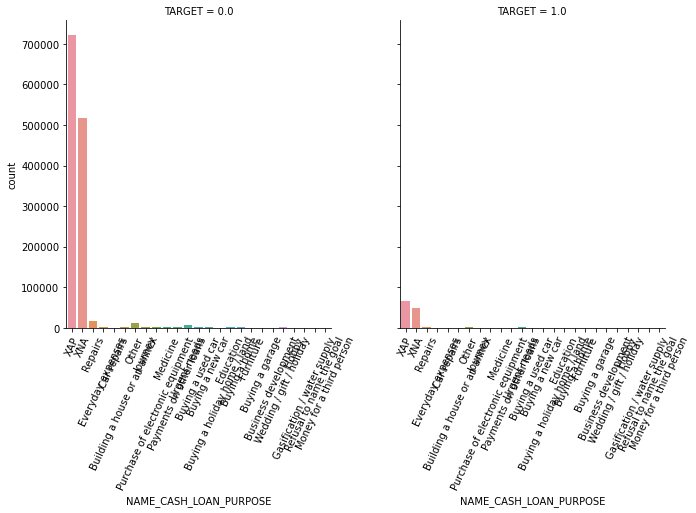

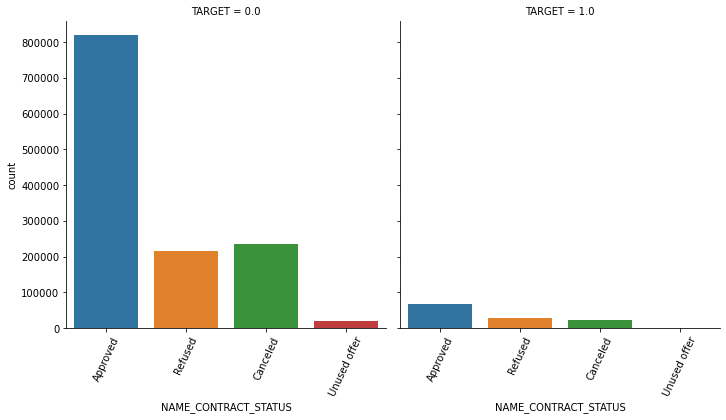

...

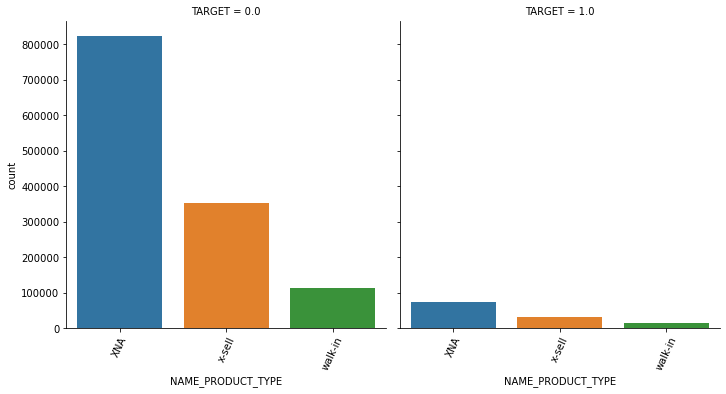

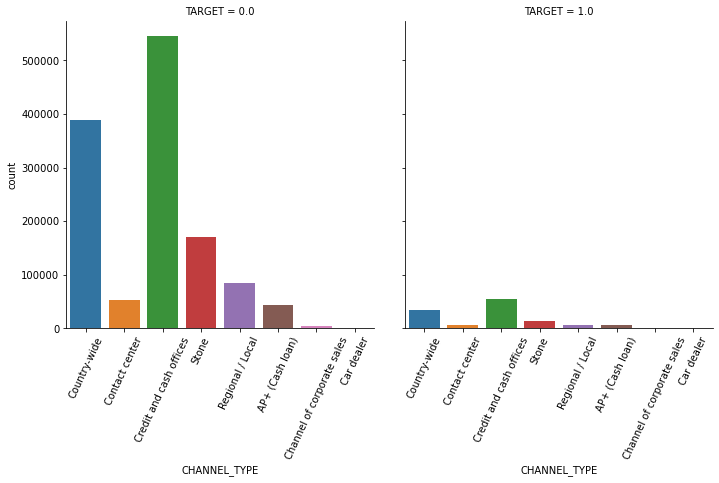

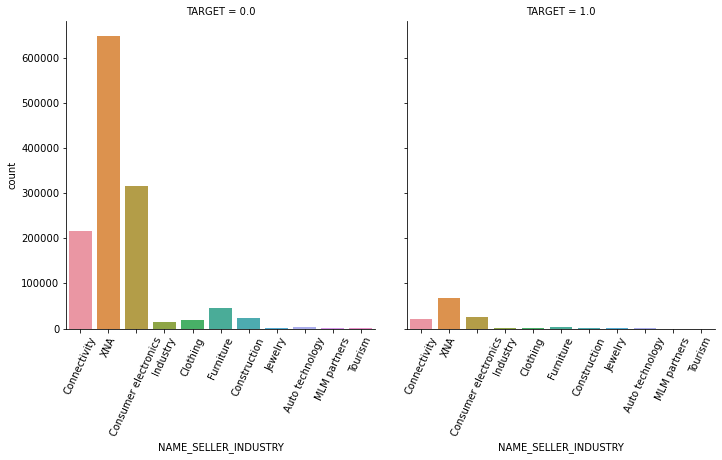

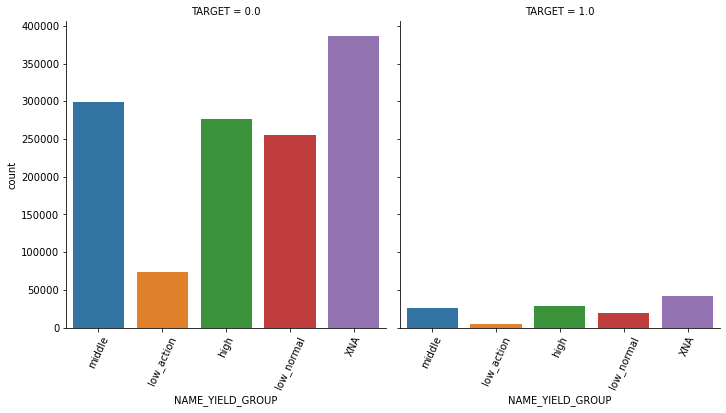

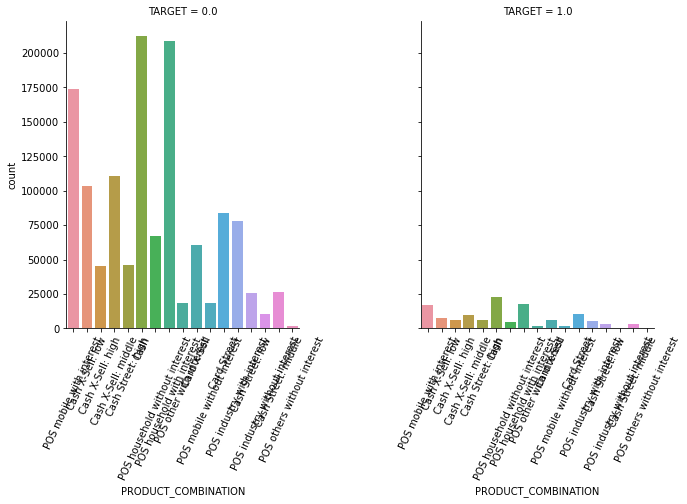

In [ ]:
def show_category_by_target(df, columns):
    for column in columns:
        chart = sns.catplot(x=column, col="TARGET", data=df, kind="count")
        chart.set_xticklabels(rotation=65)
        
show_category_by_target(app_prev, object_columns)

* NAME_CONTRACT_TYPE은 TARGET=1일때 CASH_LOAN의 비중이 약간 높음
* NAME_CONTRACT_STATUS(대출허가상태)는 TARGET=1일때 상대적으로 TARGET=0 대비 (당연히) Refused의 비율이 높음. 
* NAME_PAYMENT_TYPE(대출납부방법)는 TARGET=1일때 상대적으로 TARGET=0 대비 XNA의 비율이 약간 높음.

##### pandas groupby 단일 aggregation 함수 사용
* groupby SK_ID_CURR
* SK_ID_CURR별 건수, AMT_CREDIT에 대한 평균, 최대 값

In [ ]:
prev.groupby('SK_ID_CURR')

In [ ]:
# DataFrameGroupby 생성. 
prev_group= prev.groupby('SK_ID_CURR')

# DataFrameGroupby 객체에 aggregation함수 수행 결과를 저장한 DataFrame 생성 및 aggregation값 저장. 
prev_agg = pd.DataFrame()
prev_agg['CNT'] = prev_group['SK_ID_CURR'].count()
prev_agg['AVG_CREDIT'] = prev_group['AMT_CREDIT'].mean()
prev_agg['MAX_CREDIT'] = prev_group['AMT_CREDIT'].max()

# groupby 컬럼값이 DataFrame의 Index가 됨. 컬럼으로 변환하려면 reset_index()로 변환 필요. 
prev_agg.head(10)

,CNT,AVG_CREDIT,MAX_CREDIT
SK_ID_CURR,,,
100001,1,23787.000000,23787.0
100002,1,179055.000000,179055.0
100003,3,484191.000000,1035882.0
100004,1,20106.000000,20106.0
100005,2,20076.750000,40153.5
100006,9,291695.500000,906615.0
100007,6,166638.750000,284400.0
100008,5,162767.700000,501975.0
100009,7,70137.642857,98239.5


##### groupby agg()함수를 이용하여 여러개의 aggregation 함수 적용

In [ ]:
prev_group = prev.groupby('SK_ID_CURR')

# DataFrameGroupby의 agg() 함수를 이용하여 여러개의 aggregation 함수 적용
prev_agg1 = prev_group['AMT_CREDIT'].agg(['mean', 'max', 'sum'])
prev_agg2 = prev_group['AMT_ANNUITY'].agg(['mean', 'max', 'sum'])
# merge를 이용하여 두개의 DataFrame 결합. 
prev_agg = prev_agg1.merge(prev_agg2, on='SK_ID_CURR', how='inner')
prev_agg.head(10)

,mean_x,max_x,sum_x,mean_y,max_y,sum_y
SK_ID_CURR,,,,,,
100001,23787.000000,23787.0,23787.0,3951.000000,3951.000,3951.000
100002,179055.000000,179055.0,179055.0,9251.775000,9251.775,9251.775
100003,484191.000000,1035882.0,1452573.0,56553.990000,98356.995,169661.970
100004,20106.000000,20106.0,20106.0,5357.250000,5357.250,5357.250
100005,20076.750000,40153.5,40153.5,4813.200000,4813.200,4813.200
100006,291695.500000,906615.0,2625259.5,23651.175000,39954.510,141907.050
100007,166638.750000,284400.0,999832.5,12278.805000,22678.785,73672.830
100008,162767.700000,501975.0,813838.5,15839.696250,25309.575,63358.785
100009,70137.642857,98239.5,490963.5,10051.412143,17341.605,70359.885


##### agg()에 dictionary를 이용하여 groupby 적용

In [ ]:
agg_dict = {
    'SK_ID_CURR':['count'],
    'AMT_CREDIT':['mean', 'max', 'sum'],
    'AMT_ANNUITY':['mean', 'max', 'sum'], 
    'AMT_APPLICATION':['mean', 'max', 'sum'],
    'AMT_DOWN_PAYMENT':['mean', 'max', 'sum'],
    'AMT_GOODS_PRICE':['mean', 'max', 'sum']
}

prev_group = prev.groupby('SK_ID_CURR')
prev_amt_agg = prev_group.agg(agg_dict)
prev_amt_agg.head()

SK_ID_CURR AMT_CREDIT                       AMT_ANNUITY             \
                count       mean        max        sum        mean        max   
SK_ID_CURR                                                                      
100001              1   23787.00    23787.0    23787.0    3951.000   3951.000   
100002              1  179055.00   179055.0   179055.0    9251.775   9251.775   
100003              3  484191.00  1035882.0  1452573.0   56553.990  98356.995   
100004              1   20106.00    20106.0    20106.0    5357.250   5357.250   
100005              2   20076.75    40153.5    40153.5    4813.200   4813.200   

                       AMT_APPLICATION                      AMT_DOWN_PAYMENT  \
                   sum            mean       max        sum             mean   
SK_ID_CURR                                                                     
100001        3951.000        24835.50   24835.5    24835.5           2520.0   
100002        9251.775       179055.00  179055.0   179055.0              0.0   
100003      169661.970       435436.50  900000.0  1306309.5           3442.5   
100004        5357.250        24282.00   24282.0    24282.0           4860.0   
100005        4813.200        22308.75   44617.5    44617.5           4464.0   

                           AMT_GOODS_PRICE                       
               max     sum            mean       max        sum  
SK_ID_CURR                                                       
100001      2520.0  2520.0         24835.5   24835.5    24835.5  
100002         0.0     0.0        179055.0  179055.0   179055.0  
100003      6885.0  6885.0        435436.5  900000.0  1306309.5  
100004      4860.0  4860.0         24282.0   24282.0    24282.0  
100005      4464.0  4464.0         44617.5   44617.5    44617.5

##### grouby agg 로 만들어진  Multi index 컬럼 변경. 
* MultiIndex로 되어 있는 컬럼명 확인
* MultiIndex 컬럼명을 _로 연결하여 컬럼명 변경. 

In [ ]:
prev_amt_agg.columns

MultiIndex([(      'SK_ID_CURR', 'count'),
            (      'AMT_CREDIT',  'mean'),
            (      'AMT_CREDIT',   'max'),
            (      'AMT_CREDIT',   'sum'),
            (     'AMT_ANNUITY',  'mean'),
            (     'AMT_ANNUITY',   'max'),
            (     'AMT_ANNUITY',   'sum'),
            ( 'AMT_APPLICATION',  'mean'),
            ( 'AMT_APPLICATION',   'max'),
            ( 'AMT_APPLICATION',   'sum'),
            ('AMT_DOWN_PAYMENT',  'mean'),
            ('AMT_DOWN_PAYMENT',   'max'),
            ('AMT_DOWN_PAYMENT',   'sum'),
            ( 'AMT_GOODS_PRICE',  'mean'),
            ( 'AMT_GOODS_PRICE',   'max'),
            ( 'AMT_GOODS_PRICE',   'sum')],
           )

In [ ]:
# multi index 컬럼을 '_'로 연결하여 컬럼명 변경
prev_amt_agg.columns = ["PREV_"+"_".join(x).upper() for x in prev_amt_agg.columns.ravel()]

In [ ]:
prev_amt_agg.head()

,PREV_SK_ID_CURR_COUNT,PREV_AMT_CREDIT_MEAN,PREV_AMT_CREDIT_MAX,PREV_AMT_CREDIT_SUM,PREV_AMT_ANNUITY_MEAN,PREV_AMT_ANNUITY_MAX,PREV_AMT_ANNUITY_SUM,PREV_AMT_APPLICATION_MEAN,PREV_AMT_APPLICATION_MAX,PREV_AMT_APPLICATION_SUM,PREV_AMT_DOWN_PAYMENT_MEAN,PREV_AMT_DOWN_PAYMENT_MAX,PREV_AMT_DOWN_PAYMENT_SUM,PREV_AMT_GOODS_PRICE_MEAN,PREV_AMT_GOODS_PRICE_MAX,PREV_AMT_GOODS_PRICE_SUM
SK_ID_CURR,,,,,,,,,,,,,,,,
100001,1,23787.00,23787.0,23787.0,3951.000,3951.000,3951.000,24835.50,24835.5,24835.5,2520.0,2520.0,2520.0,24835.5,24835.5,24835.5
100002,1,179055.00,179055.0,179055.0,9251.775,9251.775,9251.775,179055.00,179055.0,179055.0,0.0,0.0,0.0,179055.0,179055.0,179055.0
100003,3,484191.00,1035882.0,1452573.0,56553.990,98356.995,169661.970,435436.50,900000.0,1306309.5,3442.5,6885.0,6885.0,435436.5,900000.0,1306309.5
100004,1,20106.00,20106.0,20106.0,5357.250,5357.250,5357.250,24282.00,24282.0,24282.0,4860.0,4860.0,4860.0,24282.0,24282.0,24282.0
100005,2,20076.75,40153.5,40153.5,4813.200,4813.200,4813.200,22308.75,44617.5,44617.5,4464.0,4464.0,4464.0,44617.5,44617.5,44617.5


##### prev 피처 가공. 대출 신청액 대비 다른 금액 차이 및 비율 생성. 

In [ ]:
# 대출 신청 금액과 실제 대출액/대출 상품금액 차이 및 비율
prev['PREV_CREDIT_DIFF'] = prev['AMT_APPLICATION'] - prev['AMT_CREDIT']
prev['PREV_GOODS_DIFF'] = prev['AMT_APPLICATION'] - prev['AMT_GOODS_PRICE']
prev['PREV_CREDIT_APPL_RATIO'] = prev['AMT_CREDIT']/prev['AMT_APPLICATION']
prev['PREV_ANNUITY_APPL_RATIO'] = prev['AMT_ANNUITY']/prev['AMT_APPLICATION']
prev['PREV_GOODS_APPL_RATIO'] = prev['AMT_GOODS_PRICE']/prev['AMT_APPLICATION']

##### DAYS_XXX 피처의 365243 을 NULL로 변환하고, 첫번째 만기일과 마지막 만기일까지의 기간 가공

In [ ]:
prev['DAYS_FIRST_DRAWING'].replace(365243, np.nan, inplace= True)
prev['DAYS_FIRST_DUE'].replace(365243, np.nan, inplace= True)
prev['DAYS_LAST_DUE_1ST_VERSION'].replace(365243, np.nan, inplace= True)
prev['DAYS_LAST_DUE'].replace(365243, np.nan, inplace= True)
prev['DAYS_TERMINATION'].replace(365243, np.nan, inplace= True)
# 첫번째 만기일과 마지막 만기일까지의 기간
prev['PREV_DAYS_LAST_DUE_DIFF'] = prev['DAYS_LAST_DUE_1ST_VERSION'] - prev['DAYS_LAST_DUE']

##### 기존 이자율 관련 컬럼이 null이 많아서 새롭게 간단한 이자율을 대출 금액과 대출 금액 납부 횟수를 기반으로 계산 

In [ ]:
# 매월 납부 금액과 납부 횟수 곱해서 전체 납부 금액 구함. 
all_pay = prev['AMT_ANNUITY'] * prev['CNT_PAYMENT']
# 전체 납부 금액 대비 AMT_CREDIT 비율을 구하고 여기에 다시 납부횟수로 나누어서 이자율 계산. 
prev['PREV_INTERESTS_RATE'] = (all_pay/prev['AMT_CREDIT'] - 1)/prev['CNT_PAYMENT']


In [ ]:
prev.iloc[:, -7:].head(10)

,PREV_CREDIT_DIFF,PREV_GOODS_DIFF,PREV_CREDIT_APPL_RATIO,PREV_ANNUITY_APPL_RATIO,PREV_GOODS_APPL_RATIO,PREV_DAYS_LAST_DUE_DIFF,PREV_INTERESTS_RATE
0,0.0,0.0,1.000000,0.100929,1.0,342.0,0.017596
1,-72171.0,0.0,1.118800,0.041463,1.0,NaN,0.009282
2,-23944.5,0.0,1.212840,0.133873,1.0,NaN,0.027047
3,-20790.0,0.0,1.046200,0.104536,1.0,30.0,0.016587
4,-66555.0,0.0,1.197200,0.094591,1.0,NaN,0.037343
5,-25573.5,0.0,1.081186,0.075251,1.0,0.0,0.014044
6,0.0,NaN,NaN,NaN,NaN,NaN,NaN
7,0.0,NaN,NaN,NaN,NaN,NaN,NaN
8,0.0,NaN,NaN,NaN,NaN,NaN,NaN
9,0.0,NaN,NaN,NaN,NaN,NaN,NaN


##### 기존 대출 금액, 대출 상태 관련 피처들과 이들을 가공하여 만들어진 새로운 컬럼들로 aggregation 수행.

In [ ]:
# 새롭게 생성된 대출 신청액 대비 다른 금액 차이 및 비율로 aggregation 수행. 
agg_dict = {
     # 기존 컬럼. 
    'SK_ID_CURR':['count'],
    'AMT_CREDIT':['mean', 'max', 'sum'],
    'AMT_ANNUITY':['mean', 'max', 'sum'], 
    'AMT_APPLICATION':['mean', 'max', 'sum'],
    'AMT_DOWN_PAYMENT':['mean', 'max', 'sum'],
    'AMT_GOODS_PRICE':['mean', 'max', 'sum'],
    'RATE_DOWN_PAYMENT': ['min', 'max', 'mean'],
    'DAYS_DECISION': ['min', 'max', 'mean'],
    'CNT_PAYMENT': ['mean', 'sum'],
    # 가공 컬럼
    'PREV_CREDIT_DIFF':['mean', 'max', 'sum'], 
    'PREV_CREDIT_APPL_RATIO':['mean', 'max'],
    'PREV_GOODS_DIFF':['mean', 'max', 'sum'],
    'PREV_GOODS_APPL_RATIO':['mean', 'max'],
    'PREV_DAYS_LAST_DUE_DIFF':['mean', 'max', 'sum'],
    'PREV_INTERESTS_RATE':['mean', 'max']
}

prev_group = prev.groupby('SK_ID_CURR')
prev_amt_agg = prev_group.agg(agg_dict)

# multi index 컬럼을 '_'로 연결하여 컬럼명 변경
prev_amt_agg.columns = ["PREV_"+ "_".join(x).upper() for x in prev_amt_agg.columns.ravel()]

In [ ]:
prev_amt_agg.head()

,PREV_SK_ID_CURR_COUNT,PREV_AMT_CREDIT_MEAN,PREV_AMT_CREDIT_MAX,PREV_AMT_CREDIT_SUM,PREV_AMT_ANNUITY_MEAN,PREV_AMT_ANNUITY_MAX,PREV_AMT_ANNUITY_SUM,PREV_AMT_APPLICATION_MEAN,PREV_AMT_APPLICATION_MAX,PREV_AMT_APPLICATION_SUM,PREV_AMT_DOWN_PAYMENT_MEAN,PREV_AMT_DOWN_PAYMENT_MAX,PREV_AMT_DOWN_PAYMENT_SUM,PREV_AMT_GOODS_PRICE_MEAN,PREV_AMT_GOODS_PRICE_MAX,PREV_AMT_GOODS_PRICE_SUM,PREV_RATE_DOWN_PAYMENT_MIN,PREV_RATE_DOWN_PAYMENT_MAX,PREV_RATE_DOWN_PAYMENT_MEAN,PREV_DAYS_DECISION_MIN,PREV_DAYS_DECISION_MAX,PREV_DAYS_DECISION_MEAN,PREV_CNT_PAYMENT_MEAN,PREV_CNT_PAYMENT_SUM,PREV_PREV_CREDIT_DIFF_MEAN,PREV_PREV_CREDIT_DIFF_MAX,PREV_PREV_CREDIT_DIFF_SUM,PREV_PREV_CREDIT_APPL_RATIO_MEAN,PREV_PREV_CREDIT_APPL_RATIO_MAX,PREV_PREV_GOODS_DIFF_MEAN,PREV_PREV_GOODS_DIFF_MAX,PREV_PREV_GOODS_DIFF_SUM,PREV_PREV_GOODS_APPL_RATIO_MEAN,PREV_PREV_GOODS_APPL_RATIO_MAX,PREV_PREV_DAYS_LAST_DUE_DIFF_MEAN,PREV_PREV_DAYS_LAST_DUE_DIFF_MAX,PREV_PREV_DAYS_LAST_DUE_DIFF_SUM,PREV_PREV_INTERESTS_RATE_MEAN,PREV_PREV_INTERESTS_RATE_MAX
SK_ID_CURR,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
100001,1,23787.00,23787.0,23787.0,3951.000,3951.000,3951.000,24835.50,24835.5,24835.5,2520.0,2520.0,2520.0,24835.5,24835.5,24835.5,0.104326,0.104326,0.104326,-1740,-1740,-1740.0,8.0,8.0,1048.5,1048.5,1048.5,0.957782,0.957782,0.0,0.0,0.0,1.0,1.0,120.0,120.0,120.0,0.041099,0.041099
100002,1,179055.00,179055.0,179055.0,9251.775,9251.775,9251.775,179055.00,179055.0,179055.0,0.0,0.0,0.0,179055.0,179055.0,179055.0,0.000000,0.000000,0.000000,-606,-606,-606.0,24.0,24.0,0.0,0.0,0.0,1.000000,1.000000,0.0,0.0,0.0,1.0,1.0,150.0,150.0,150.0,0.010003,0.010003
100003,3,484191.00,1035882.0,1452573.0,56553.990,98356.995,169661.970,435436.50,900000.0,1306309.5,3442.5,6885.0,6885.0,435436.5,900000.0,1306309.5,0.000000,0.100061,0.050030,-2341,-746,-1305.0,10.0,30.0,-48754.5,756.0,-146263.5,1.057664,1.150980,0.0,0.0,0.0,1.0,1.0,50.0,150.0,150.0,0.015272,0.018533
100004,1,20106.00,20106.0,20106.0,5357.250,5357.250,5357.250,24282.00,24282.0,24282.0,4860.0,4860.0,4860.0,24282.0,24282.0,24282.0,0.212008,0.212008,0.212008,-815,-815,-815.0,4.0,4.0,4176.0,4176.0,4176.0,0.828021,0.828021,0.0,0.0,0.0,1.0,1.0,30.0,30.0,30.0,0.016450,0.016450
100005,2,20076.75,40153.5,40153.5,4813.200,4813.200,4813.200,22308.75,44617.5,44617.5,4464.0,4464.0,4464.0,44617.5,44617.5,44617.5,0.108964,0.108964,0.108964,-757,-315,-536.0,12.0,12.0,2232.0,4464.0,4464.0,0.899950,0.899950,0.0,0.0,0.0,1.0,1.0,90.0,90.0,90.0,0.036537,0.036537


#### SK_ID_CURR별로 NAME_CONTRACT_STATUS가 Refused 일 경우의 건수 및 과거 대출건 대비 비율

#### Group by 기준  컬럼 기반에서 다른 컬럼들의 기준에 따라 세분화된 aggregation 수행. 

In [ ]:
prev['NAME_CONTRACT_STATUS'].value_counts()

Approved        1036781
Canceled         316319
Refused          290678
Unused offer      26436
Name: NAME_CONTRACT_STATUS, dtype: int64

##### Pandas는 원 DataFrame 에 groupby 적용된 DataFrame 과 세부기준으로 filtering 된 DataFrame에 groupby 적용된 DataFrame 을 조인하여 생성. 
* NAME_CONTRACT_STATUS == 'Refused' 세부 기준으로 filtering 및 filtering 된 DataFrame에 groupby 적용 
* groupby 완료 후 기존 prev_amt_agg와 조인
* 효율적인 오류 방지를 위해서 groupby 시 적용후 groupby key값을 DataFrame의 Index가 아닌 일반 컬럼으로 변경.

In [ ]:
# NAME_CONTRACT_STATUS == 'Refused' 세부 기준으로 filtering 
cond_refused = (prev['NAME_CONTRACT_STATUS'] == 'Refused')
prev_refused = prev[cond_refused]
prev_refused.shape, prev.shape

((290678, 44), (1670214, 44))

In [ ]:
# NAME_CONTRACT_STATUS == 'Refused' 세부 기준으로 filtering 된 DataFrame에 groupby 적용 
prev_refused_agg = prev_refused.groupby(['SK_ID_CURR'])['SK_ID_CURR'].count()
print(prev_amt_agg.shape, prev_refused_agg .shape)
prev_refused_agg.head(10)

(338857, 39) (118277,)


SK_ID_CURR
100006     1
100011     1
100027     1
100030    10
100035     8
100036     3
100037     2
100043     5
100046     1
100047     2
Name: SK_ID_CURR, dtype: int64

In [ ]:
# prev_refused_agg은 Series객체이고 Index는 SK_ID_CURR, prev_amt_agg은 DataFrame, Index는 SK_ID_CURR. 하지만 JOIN되지 않는다. 
# Series와 DataFrame 조인 시 Series를 DataFrame으로 내부 변환하는데 조인 시 Index명과 컬럼명이 서로 충돌하여 오류. 
# prev_amt_refused_agg = prev_amt_agg.merge(prev_refused_agg, on='SK_ID_CURR', how='left')

pd.DataFrame(prev_refused_agg)

# 일반적으로 groupby key를 INDEX로 하는 것보다 일반 컬럼으로 하는 것이 여러가지 오류 예방에 효율적. 
prev_refused_agg = prev_refused_agg.reset_index(name='PREV_REFUSED_COUNT')
prev_amt_agg = prev_amt_agg.reset_index()

prev_amt_refused_agg = prev_amt_agg.merge(prev_refused_agg, on='SK_ID_CURR', how='left')
prev_amt_refused_agg.head()

,SK_ID_CURR,PREV_SK_ID_CURR_COUNT,PREV_AMT_CREDIT_MEAN,PREV_AMT_CREDIT_MAX,PREV_AMT_CREDIT_SUM,PREV_AMT_ANNUITY_MEAN,PREV_AMT_ANNUITY_MAX,PREV_AMT_ANNUITY_SUM,PREV_AMT_APPLICATION_MEAN,PREV_AMT_APPLICATION_MAX,PREV_AMT_APPLICATION_SUM,PREV_AMT_DOWN_PAYMENT_MEAN,PREV_AMT_DOWN_PAYMENT_MAX,PREV_AMT_DOWN_PAYMENT_SUM,PREV_AMT_GOODS_PRICE_MEAN,PREV_AMT_GOODS_PRICE_MAX,PREV_AMT_GOODS_PRICE_SUM,PREV_RATE_DOWN_PAYMENT_MIN,PREV_RATE_DOWN_PAYMENT_MAX,PREV_RATE_DOWN_PAYMENT_MEAN,PREV_DAYS_DECISION_MIN,PREV_DAYS_DECISION_MAX,PREV_DAYS_DECISION_MEAN,PREV_CNT_PAYMENT_MEAN,PREV_CNT_PAYMENT_SUM,PREV_PREV_CREDIT_DIFF_MEAN,PREV_PREV_CREDIT_DIFF_MAX,PREV_PREV_CREDIT_DIFF_SUM,PREV_PREV_CREDIT_APPL_RATIO_MEAN,PREV_PREV_CREDIT_APPL_RATIO_MAX,PREV_PREV_GOODS_DIFF_MEAN,PREV_PREV_GOODS_DIFF_MAX,PREV_PREV_GOODS_DIFF_SUM,PREV_PREV_GOODS_APPL_RATIO_MEAN,PREV_PREV_GOODS_APPL_RATIO_MAX,PREV_PREV_DAYS_LAST_DUE_DIFF_MEAN,PREV_PREV_DAYS_LAST_DUE_DIFF_MAX,PREV_PREV_DAYS_LAST_DUE_DIFF_SUM,PREV_PREV_INTERESTS_RATE_MEAN,PREV_PREV_INTERESTS_RATE_MAX,PREV_REFUSED_COUNT
0,100001,1,23787.00,23787.0,23787.0,3951.000,3951.000,3951.000,24835.50,24835.5,24835.5,2520.0,2520.0,2520.0,24835.5,24835.5,24835.5,0.104326,0.104326,0.104326,-1740,-1740,-1740.0,8.0,8.0,1048.5,1048.5,1048.5,0.957782,0.957782,0.0,0.0,0.0,1.0,1.0,120.0,120.0,120.0,0.041099,0.041099,NaN
1,100002,1,179055.00,179055.0,179055.0,9251.775,9251.775,9251.775,179055.00,179055.0,179055.0,0.0,0.0,0.0,179055.0,179055.0,179055.0,0.000000,0.000000,0.000000,-606,-606,-606.0,24.0,24.0,0.0,0.0,0.0,1.000000,1.000000,0.0,0.0,0.0,1.0,1.0,150.0,150.0,150.0,0.010003,0.010003,NaN
2,100003,3,484191.00,1035882.0,1452573.0,56553.990,98356.995,169661.970,435436.50,900000.0,1306309.5,3442.5,6885.0,6885.0,435436.5,900000.0,1306309.5,0.000000,0.100061,0.050030,-2341,-746,-1305.0,10.0,30.0,-48754.5,756.0,-146263.5,1.057664,1.150980,0.0,0.0,0.0,1.0,1.0,50.0,150.0,150.0,0.015272,0.018533,NaN
3,100004,1,20106.00,20106.0,20106.0,5357.250,5357.250,5357.250,24282.00,24282.0,24282.0,4860.0,4860.0,4860.0,24282.0,24282.0,24282.0,0.212008,0.212008,0.212008,-815,-815,-815.0,4.0,4.0,4176.0,4176.0,4176.0,0.828021,0.828021,0.0,0.0,0.0,1.0,1.0,30.0,30.0,30.0,0.016450,0.016450,NaN
4,100005,2,20076.75,40153.5,40153.5,4813.200,4813.200,4813.200,22308.75,44617.5,44617.5,4464.0,4464.0,4464.0,44617.5,44617.5,44617.5,0.108964,0.108964,0.108964,-757,-315,-536.0,12.0,12.0,2232.0,4464.0,4464.0,0.899950,0.899950,0.0,0.0,0.0,1.0,1.0,90.0,90.0,90.0,0.036537,0.036537,NaN


##### 계산된 PREV_REFUSED_COUNT 중 Null값은 0 으로 변경하고 SK_ID_CURR 개별 건수 대비 PREV_REFUSED_COUNT 비율 계산

In [ ]:
prev_amt_refused_agg['PREV_REFUSED_COUNT'].value_counts(dropna=False)

NaN     220580
1.0      54616
2.0      26793
3.0      14025
4.0       8243
5.0       4859
6.0       3147
7.0       2069
8.0       1247
9.0        871
10.0       656
11.0       437
12.0       340
13.0       233
14.0       157
15.0       149
16.0        94
17.0        62
18.0        54
19.0        48
20.0        28
21.0        25
22.0        21
24.0        18
25.0        12
26.0        11
23.0        11
27.0         8
29.0         5
28.0         5
32.0         4
31.0         3
41.0         3
30.0         3
37.0         3
33.0         2
34.0         2
39.0         2
35.0         2
36.0         2
47.0         1
43.0         1
64.0         1
54.0         1
58.0         1
51.0         1
68.0         1
Name: PREV_REFUSED_COUNT, dtype: int64

In [ ]:
# REFUSED_COUNT가 NaN인 데이터는 과거 대출신청시 Refused가 없는 것임. 따라서 0으로 치환해야함. 
prev_amt_refused_agg['PREV_REFUSED_COUNT'] = prev_amt_refused_agg['PREV_REFUSED_COUNT'].fillna(0)
# SK_ID_CURR별 과거 대출건수 대비 REFUSED_COUNT 비율 생성. 
prev_amt_refused_agg['PREV_REFUSED_RATIO'] = prev_amt_refused_agg['PREV_REFUSED_COUNT']/prev_amt_refused_agg['PREV_SK_ID_CURR_COUNT']

In [ ]:
prev_amt_refused_agg.head(30)

,SK_ID_CURR,PREV_SK_ID_CURR_COUNT,PREV_AMT_CREDIT_MEAN,PREV_AMT_CREDIT_MAX,PREV_AMT_CREDIT_SUM,PREV_AMT_ANNUITY_MEAN,PREV_AMT_ANNUITY_MAX,PREV_AMT_ANNUITY_SUM,PREV_AMT_APPLICATION_MEAN,PREV_AMT_APPLICATION_MAX,PREV_AMT_APPLICATION_SUM,PREV_AMT_DOWN_PAYMENT_MEAN,PREV_AMT_DOWN_PAYMENT_MAX,PREV_AMT_DOWN_PAYMENT_SUM,PREV_AMT_GOODS_PRICE_MEAN,PREV_AMT_GOODS_PRICE_MAX,PREV_AMT_GOODS_PRICE_SUM,PREV_RATE_DOWN_PAYMENT_MIN,PREV_RATE_DOWN_PAYMENT_MAX,PREV_RATE_DOWN_PAYMENT_MEAN,PREV_DAYS_DECISION_MIN,PREV_DAYS_DECISION_MAX,PREV_DAYS_DECISION_MEAN,PREV_CNT_PAYMENT_MEAN,PREV_CNT_PAYMENT_SUM,PREV_PREV_CREDIT_DIFF_MEAN,PREV_PREV_CREDIT_DIFF_MAX,PREV_PREV_CREDIT_DIFF_SUM,PREV_PREV_CREDIT_APPL_RATIO_MEAN,PREV_PREV_CREDIT_APPL_RATIO_MAX,PREV_PREV_GOODS_DIFF_MEAN,PREV_PREV_GOODS_DIFF_MAX,PREV_PREV_GOODS_DIFF_SUM,PREV_PREV_GOODS_APPL_RATIO_MEAN,PREV_PREV_GOODS_APPL_RATIO_MAX,PREV_PREV_DAYS_LAST_DUE_DIFF_MEAN,PREV_PREV_DAYS_LAST_DUE_DIFF_MAX,PREV_PREV_DAYS_LAST_DUE_DIFF_SUM,PREV_PREV_INTERESTS_RATE_MEAN,PREV_PREV_INTERESTS_RATE_MAX,PREV_REFUSED_COUNT,PREV_REFUSED_RATIO
0,100001,1,23787.000000,23787.0,23787.000,3951.000000,3951.000,3951.000,24835.500000,24835.5,24835.500,2520.000000,2520.0,2520.00,24835.500000,24835.5,24835.500,0.104326,0.104326,0.104326,-1740,-1740,-1740.000000,8.000000,8.0,1048.500000,1048.5,1048.50,0.957782,0.957782,0.0,0.0,0.0,1.0,1.0,120.00,120.0,120.0,0.041099,0.041099,0.0,0.000000
1,100002,1,179055.000000,179055.0,179055.000,9251.775000,9251.775,9251.775,179055.000000,179055.0,179055.000,0.000000,0.0,0.00,179055.000000,179055.0,179055.000,0.000000,0.000000,0.000000,-606,-606,-606.000000,24.000000,24.0,0.000000,0.0,0.00,1.000000,1.000000,0.0,0.0,0.0,1.0,1.0,150.00,150.0,150.0,0.010003,0.010003,0.0,0.000000
2,100003,3,484191.000000,1035882.0,1452573.000,56553.990000,98356.995,169661.970,435436.500000,900000.0,1306309.500,3442.500000,6885.0,6885.00,435436.500000,900000.0,1306309.500,0.000000,0.100061,0.050030,-2341,-746,-1305.000000,10.000000,30.0,-48754.500000,756.0,-146263.50,1.057664,1.150980,0.0,0.0,0.0,1.0,1.0,50.00,150.0,150.0,0.015272,0.018533,0.0,0.000000
3,100004,1,20106.000000,20106.0,20106.000,5357.250000,5357.250,5357.250,24282.000000,24282.0,24282.000,4860.000000,4860.0,4860.00,24282.000000,24282.0,24282.000,0.212008,0.212008,0.212008,-815,-815,-815.000000,4.000000,4.0,4176.000000,4176.0,4176.00,0.828021,0.828021,0.0,0.0,0.0,1.0,1.0,30.00,30.0,30.0,0.016450,0.016450,0.0,0.000000
4,100005,2,20076.750000,40153.5,40153.500,4813.200000,4813.200,4813.200,22308.750000,44617.5,44617.500,4464.000000,4464.0,4464.00,44617.500000,44617.5,44617.500,0.108964,0.108964,0.108964,-757,-315,-536.000000,12.000000,12.0,2232.000000,4464.0,4464.00,0.899950,0.899950,0.0,0.0,0.0,1.0,1.0,90.00,90.0,90.0,0.036537,0.036537,0.0,0.000000
5,100006,9,291695.500000,906615.0,2625259.500,23651.175000,39954.510,141907.050,272203.260000,688500.0,2449829.340,34840.170000,66987.0,69680.34,408304.890000,688500.0,2449829.340,0.108994,0.217830,0.163412,-617,-181,-272.444444,23.000000,138.0,-19492.240000,66987.0,-175430.16,1.012684,1.316797,0.0,0.0,0.0,1.0,1.0,810.00,1410.0,1620.0,-inf,0.027424,1.0,0.111111
6,100007,6,166638.750000,284400.0,999832.500,12278.805000,22678.785,73672.830,150530.250000,247500.0,903181.500,3390.750000,3676.5,6781.50,150530.250000,247500.0,903181.500,0.100143,0.218890,0.159516,-2357,-374,-1222.833333,20.666667,124.0,-16108.500000,2560.5,-96651.00,1.046356,1.264000,0.0,0.0,0.0,1.0,1.0,7.50,30.0,30.0,0.026538,0.036164,0.0,0.000000
7,100008,5,162767.700000,501975.0,813838.500,15839.696250,25309.575,63358.785,155701.800000,450000.0,778509.000,5548.500000,12145.5,16645.50,194627.250000,450000.0,778509.000,0.000000,0.110243,0.073051,-2536,-82,-1192.000000,14.000000,56.0,-7065.900000,12145.5,-35329.50,0.978569,1.115500,0.0,0.0,0.0,1.0,1.0,165.00,660.0,660.0,0.018055,0.034034,0.0,0.000000
8,100009,7,70137.642857,98239.5,490963.500,10051.412143,17341.605,70359.885,76741.714286,110160.0,537192.000,9203.142857,22032.0,64422.00,76741.714286,

In [ ]:
# 원래 groupby 컬럼 + 세부 기준 컬럼으로 groupby 수행. 세분화된 레벨로 aggregation 수행 한 뒤에 unstack()으로 컬럼레벨로 변형. 
prev_refused_appr_group = prev[prev['NAME_CONTRACT_STATUS'].isin(['Approved', 'Refused'])].groupby([ 'SK_ID_CURR', 'NAME_CONTRACT_STATUS'])
prev_refused_appr_agg = prev_refused_appr_group['SK_ID_CURR'].count().unstack()
prev_refused_appr_agg.head(30)

NAME_CONTRACT_STATUS,Approved,Refused
SK_ID_CURR,,
100001,1.0,NaN
100002,1.0,NaN
100003,3.0,NaN
100004,1.0,NaN
100005,1.0,NaN
100006,5.0,1.0
100007,6.0,NaN
100008,4.0,NaN
100009,7.0,NaN


#####  컬럼명 변경, Null 처리, 그리고 기존의 prev_amt_agg와 조인 후 데이터 가공 

In [ ]:
# 컬럼명 변경. 
prev_refused_appr_agg.columns = ['PREV_APPROVED_COUNT', 'PREV_REFUSED_COUNT' ]
# NaN값은 모두 0으로 변경. 
prev_refused_appr_agg = prev_refused_appr_agg.fillna(0)

In [ ]:
prev_refused_appr_agg.head()

,PREV_APPROVED_COUNT,PREV_REFUSED_COUNT
SK_ID_CURR,,
100001,1.0,0.0
100002,1.0,0.0
100003,3.0,0.0
100004,1.0,0.0
100005,1.0,0.0


In [ ]:
# prev_amt_agg와 조인. prev_amt_agg와 prev_refused_appr_agg 모두 SK_ID_CURR을 INDEX로 가지고 있음. 
prev_agg = prev_amt_agg.merge(prev_refused_appr_agg, on='SK_ID_CURR', how='left')
# SK_ID_CURR별 과거 대출건수 대비 APPROVED_COUNT 및 REFUSED_COUNT 비율 생성. 
prev_agg['PREV_REFUSED_RATIO'] = prev_agg['PREV_REFUSED_COUNT']/prev_agg['PREV_SK_ID_CURR_COUNT']
prev_agg['PREV_APPROVED_RATIO'] = prev_agg['PREV_APPROVED_COUNT']/prev_agg['PREV_SK_ID_CURR_COUNT']
# 'PREV_REFUSED_COUNT', 'PREV_APPROVED_COUNT' 컬럼 drop 
prev_agg = prev_agg.drop(['PREV_REFUSED_COUNT', 'PREV_APPROVED_COUNT'], axis=1)
# prev_amt_agg와 prev_refused_appr_agg INDEX인 SK_ID_CURR이 조인 후 정식 컬럼으로 생성됨. 
prev_agg.head(30)

,SK_ID_CURR,PREV_SK_ID_CURR_COUNT,PREV_AMT_CREDIT_MEAN,PREV_AMT_CREDIT_MAX,PREV_AMT_CREDIT_SUM,PREV_AMT_ANNUITY_MEAN,PREV_AMT_ANNUITY_MAX,PREV_AMT_ANNUITY_SUM,PREV_AMT_APPLICATION_MEAN,PREV_AMT_APPLICATION_MAX,PREV_AMT_APPLICATION_SUM,PREV_AMT_DOWN_PAYMENT_MEAN,PREV_AMT_DOWN_PAYMENT_MAX,PREV_AMT_DOWN_PAYMENT_SUM,PREV_AMT_GOODS_PRICE_MEAN,PREV_AMT_GOODS_PRICE_MAX,PREV_AMT_GOODS_PRICE_SUM,PREV_RATE_DOWN_PAYMENT_MIN,PREV_RATE_DOWN_PAYMENT_MAX,PREV_RATE_DOWN_PAYMENT_MEAN,PREV_DAYS_DECISION_MIN,PREV_DAYS_DECISION_MAX,PREV_DAYS_DECISION_MEAN,PREV_CNT_PAYMENT_MEAN,PREV_CNT_PAYMENT_SUM,PREV_PREV_CREDIT_DIFF_MEAN,PREV_PREV_CREDIT_DIFF_MAX,PREV_PREV_CREDIT_DIFF_SUM,PREV_PREV_CREDIT_APPL_RATIO_MEAN,PREV_PREV_CREDIT_APPL_RATIO_MAX,PREV_PREV_GOODS_DIFF_MEAN,PREV_PREV_GOODS_DIFF_MAX,PREV_PREV_GOODS_DIFF_SUM,PREV_PREV_GOODS_APPL_RATIO_MEAN,PREV_PREV_GOODS_APPL_RATIO_MAX,PREV_PREV_DAYS_LAST_DUE_DIFF_MEAN,PREV_PREV_DAYS_LAST_DUE_DIFF_MAX,PREV_PREV_DAYS_LAST_DUE_DIFF_SUM,PREV_PREV_INTERESTS_RATE_MEAN,PREV_PREV_INTERESTS_RATE_MAX,PREV_REFUSED_RATIO,PREV_APPROVED_RATIO
0,100001,1,23787.000000,23787.0,23787.000,3951.000000,3951.000,3951.000,24835.500000,24835.5,24835.500,2520.000000,2520.0,2520.00,24835.500000,24835.5,24835.500,0.104326,0.104326,0.104326,-1740,-1740,-1740.000000,8.000000,8.0,1048.500000,1048.5,1048.50,0.957782,0.957782,0.0,0.0,0.0,1.0,1.0,120.00,120.0,120.0,0.041099,0.041099,0.000000,1.000000
1,100002,1,179055.000000,179055.0,179055.000,9251.775000,9251.775,9251.775,179055.000000,179055.0,179055.000,0.000000,0.0,0.00,179055.000000,179055.0,179055.000,0.000000,0.000000,0.000000,-606,-606,-606.000000,24.000000,24.0,0.000000,0.0,0.00,1.000000,1.000000,0.0,0.0,0.0,1.0,1.0,150.00,150.0,150.0,0.010003,0.010003,0.000000,1.000000
2,100003,3,484191.000000,1035882.0,1452573.000,56553.990000,98356.995,169661.970,435436.500000,900000.0,1306309.500,3442.500000,6885.0,6885.00,435436.500000,900000.0,1306309.500,0.000000,0.100061,0.050030,-2341,-746,-1305.000000,10.000000,30.0,-48754.500000,756.0,-146263.50,1.057664,1.150980,0.0,0.0,0.0,1.0,1.0,50.00,150.0,150.0,0.015272,0.018533,0.000000,1.000000
3,100004,1,20106.000000,20106.0,20106.000,5357.250000,5357.250,5357.250,24282.000000,24282.0,24282.000,4860.000000,4860.0,4860.00,24282.000000,24282.0,24282.000,0.212008,0.212008,0.212008,-815,-815,-815.000000,4.000000,4.0,4176.000000,4176.0,4176.00,0.828021,0.828021,0.0,0.0,0.0,1.0,1.0,30.00,30.0,30.0,0.016450,0.016450,0.000000,1.000000
4,100005,2,20076.750000,40153.5,40153.500,4813.200000,4813.200,4813.200,22308.750000,44617.5,44617.500,4464.000000,4464.0,4464.00,44617.500000,44617.5,44617.500,0.108964,0.108964,0.108964,-757,-315,-536.000000,12.000000,12.0,2232.000000,4464.0,4464.00,0.899950,0.899950,0.0,0.0,0.0,1.0,1.0,90.00,90.0,90.0,0.036537,0.036537,0.000000,0.500000
5,100006,9,291695.500000,906615.0,2625259.500,23651.175000,39954.510,141907.050,272203.260000,688500.0,2449829.340,34840.170000,66987.0,69680.34,408304.890000,688500.0,2449829.340,0.108994,0.217830,0.163412,-617,-181,-272.444444,23.000000,138.0,-19492.240000,66987.0,-175430.16,1.012684,1.316797,0.0,0.0,0.0,1.0,1.0,810.00,1410.0,1620.0,-inf,0.027424,0.111111,0.555556
6,100007,6,166638.750000,284400.0,999832.500,12278.805000,22678.785,73672.830,150530.250000,247500.0,903181.500,3390.750000,3676.5,6781.50,150530.250000,247500.0,903181.500,0.100143,0.218890,0.159516,-2357,-374,-1222.833333,20.666667,124.0,-16108.500000,2560.5,-96651.00,1.046356,1.264000,0.0,0.0,0.0,1.0,1.0,7.50,30.0,30.0,0.026538,0.036164,0.000000,1.000000
7,100008,5,162767.700000,501975.0,813838.500,15839.696250,25309.575,63358.785,155701.800000,450000.0,778509.000,5548.500000,12145.5,16645.50,194627.250000,450000.0,778509.000,0.000000,0.110243,0.073051,-2536,-82,-1192.000000,14.000000,56.0,-7065.900000,12145.5,-35329.50,0.978569,1.115500,0.0,0.0,0.0,1.0,1.0,165.00,660.0,660.0,0.018055,0.034034,0.000000,0.800000
8,100009,7,70137.642857,98239.5,490963.500,10051.412143,17341.605,70359.885,76741.714286,110160.0,537192.000,9

#### 가공된 최종 데이터 세트 생성
##### 지금까지 과정을 함수화
##### 이전에 application 데이터 세트의 feature engineering 수행 후 새롭게 previous 데이터 세트로 가공된 데이터를 조인. 

In [ ]:
import numpy as np
import pandas as pd
import gc
import time
import matplotlib.pyplot as plt
import seaborn as sns
import os
%matplotlib inline

pd.set_option('display.max_rows', 100)
pd.set_option('display.max_columns', 200)

In [ ]:
def get_dataset():
    app_train = pd.read_csv('application_train.csv')
    app_test = pd.read_csv('application_test.csv')
    apps = pd.concat([app_train, app_test])
    prev = pd.read_csv('previous_application.csv')

    return apps, prev

apps, prev = get_dataset()
    

#### 이전 application 데이터의 feature engineering 함수 복사

In [ ]:
def get_apps_processed(apps):
    
    # EXT_SOURCE_X FEATURE 가공
    apps['APPS_EXT_SOURCE_MEAN'] = apps[['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']].mean(axis=1)
    apps['APPS_EXT_SOURCE_STD'] = apps[['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']].std(axis=1)
    apps['APPS_EXT_SOURCE_STD'] = apps['APPS_EXT_SOURCE_STD'].fillna(apps['APPS_EXT_SOURCE_STD'].mean())
    
    # AMT_CREDIT 비율로 Feature 가공
    apps['APPS_ANNUITY_CREDIT_RATIO'] = apps['AMT_ANNUITY']/apps['AMT_CREDIT']
    apps['APPS_GOODS_CREDIT_RATIO'] = apps['AMT_GOODS_PRICE']/apps['AMT_CREDIT']
    
    # AMT_INCOME_TOTAL 비율로 Feature 가공
    apps['APPS_ANNUITY_INCOME_RATIO'] = apps['AMT_ANNUITY']/apps['AMT_INCOME_TOTAL']
    apps['APPS_CREDIT_INCOME_RATIO'] = apps['AMT_CREDIT']/apps['AMT_INCOME_TOTAL']
    apps['APPS_GOODS_INCOME_RATIO'] = apps['AMT_GOODS_PRICE']/apps['AMT_INCOME_TOTAL']
    apps['APPS_CNT_FAM_INCOME_RATIO'] = apps['AMT_INCOME_TOTAL']/apps['CNT_FAM_MEMBERS']
    
    # DAYS_BIRTH, DAYS_EMPLOYED 비율로 Feature 가공
    apps['APPS_EMPLOYED_BIRTH_RATIO'] = apps['DAYS_EMPLOYED']/apps['DAYS_BIRTH']
    apps['APPS_INCOME_EMPLOYED_RATIO'] = apps['AMT_INCOME_TOTAL']/apps['DAYS_EMPLOYED']
    apps['APPS_INCOME_BIRTH_RATIO'] = apps['AMT_INCOME_TOTAL']/apps['DAYS_BIRTH']
    apps['APPS_CAR_BIRTH_RATIO'] = apps['OWN_CAR_AGE'] / apps['DAYS_BIRTH']
    apps['APPS_CAR_EMPLOYED_RATIO'] = apps['OWN_CAR_AGE'] / apps['DAYS_EMPLOYED']
    
    return apps

#### previous 데이터 가공후 인코딩 및 최종 데이터 집합 생성하는 함수 선언

In [ ]:
from sklearn.model_selection import train_test_split
from lightgbm import LGBMClassifier

def get_prev_processed(prev):
    # 대출 신청 금액과 실제 대출액/대출 상품금액 차이 및 비율
    prev['PREV_CREDIT_DIFF'] = prev['AMT_APPLICATION'] - prev['AMT_CREDIT']
    prev['PREV_GOODS_DIFF'] = prev['AMT_APPLICATION'] - prev['AMT_GOODS_PRICE']
    prev['PREV_CREDIT_APPL_RATIO'] = prev['AMT_CREDIT']/prev['AMT_APPLICATION']
    # prev['PREV_ANNUITY_APPL_RATIO'] = prev['AMT_ANNUITY']/prev['AMT_APPLICATION']
    prev['PREV_GOODS_APPL_RATIO'] = prev['AMT_GOODS_PRICE']/prev['AMT_APPLICATION']
    
    prev['DAYS_FIRST_DRAWING'].replace(365243, np.nan, inplace= True)
    prev['DAYS_FIRST_DUE'].replace(365243, np.nan, inplace= True)
    prev['DAYS_LAST_DUE_1ST_VERSION'].replace(365243, np.nan, inplace= True)
    prev['DAYS_LAST_DUE'].replace(365243, np.nan, inplace= True)
    prev['DAYS_TERMINATION'].replace(365243, np.nan, inplace= True)
    # 첫번째 만기일과 마지막 만기일까지의 기간
    prev['PREV_DAYS_LAST_DUE_DIFF'] = prev['DAYS_LAST_DUE_1ST_VERSION'] - prev['DAYS_LAST_DUE']
    # 매월 납부 금액과 납부 횟수 곱해서 전체 납부 금액 구함. 
    all_pay = prev['AMT_ANNUITY'] * prev['CNT_PAYMENT']
    # 전체 납부 금액 대비 AMT_CREDIT 비율을 구하고 여기에 다시 납부횟수로 나누어서 이자율 계산. 
    prev['PREV_INTERESTS_RATE'] = (all_pay/prev['AMT_CREDIT'] - 1)/prev['CNT_PAYMENT']
        
    return prev
    
    
def get_prev_amt_agg(prev):
    # 새롭게 생성된 대출 신청액 대비 다른 금액 차이 및 비율로 aggregation 수행. 
    agg_dict = {
         # 기존 컬럼. 
        'SK_ID_CURR':['count'],
        'AMT_CREDIT':['mean', 'max', 'sum'],
        'AMT_ANNUITY':['mean', 'max', 'sum'], 
        'AMT_APPLICATION':['mean', 'max', 'sum'],
        'AMT_DOWN_PAYMENT':['mean', 'max', 'sum'],
        'AMT_GOODS_PRICE':['mean', 'max', 'sum'],
        'RATE_DOWN_PAYMENT': ['min', 'max', 'mean'],
        'DAYS_DECISION': ['min', 'max', 'mean'],
        'CNT_PAYMENT': ['mean', 'sum'],
        # 가공 컬럼
        'PREV_CREDIT_DIFF':['mean', 'max', 'sum'], 
        'PREV_CREDIT_APPL_RATIO':['mean', 'max'],
        'PREV_GOODS_DIFF':['mean', 'max', 'sum'],
        'PREV_GOODS_APPL_RATIO':['mean', 'max'],
        'PREV_DAYS_LAST_DUE_DIFF':['mean', 'max', 'sum'],
        'PREV_INTERESTS_RATE':['mean', 'max']
    }

    prev_group = prev.groupby('SK_ID_CURR')
    prev_amt_agg = prev_group.agg(agg_dict)

    # multi index 컬럼을 '_'로 연결하여 컬럼명 변경
    prev_amt_agg.columns = ["PREV_"+ "_".join(x).upper() for x in prev_amt_agg.columns.ravel()]
    
    return prev_amt_agg

def get_prev_refused_appr_agg(prev):
    # 원래 groupby 컬럼 + 세부 기준 컬럼으로 groupby 수행. 세분화된 레벨로 aggregation 수행 한 뒤에 unstack()으로 컬럼레벨로 변형. 
    prev_refused_appr_group = prev[prev['NAME_CONTRACT_STATUS'].isin(['Approved', 'Refused'])].groupby([ 'SK_ID_CURR', 'NAME_CONTRACT_STATUS'])
    prev_refused_appr_agg = prev_refused_appr_group['SK_ID_CURR'].count().unstack()
    # 컬럼명 변경. 
    prev_refused_appr_agg.columns = ['PREV_APPROVED_COUNT', 'PREV_REFUSED_COUNT' ]
    # NaN값은 모두 0으로 변경. 
    prev_refused_appr_agg = prev_refused_appr_agg.fillna(0)
    
    return prev_refused_appr_agg

    

def get_prev_agg(prev):
    prev = get_prev_processed(prev)
    prev_amt_agg = get_prev_amt_agg(prev)
    prev_refused_appr_agg = get_prev_refused_appr_agg(prev)
    
    # prev_amt_agg와 조인. 
    prev_agg = prev_amt_agg.merge(prev_refused_appr_agg, on='SK_ID_CURR', how='left')
    # SK_ID_CURR별 과거 대출건수 대비 APPROVED_COUNT 및 REFUSED_COUNT 비율 생성. 
    prev_agg['PREV_REFUSED_RATIO'] = prev_agg['PREV_REFUSED_COUNT']/prev_agg['PREV_SK_ID_CURR_COUNT']
    prev_agg['PREV_APPROVED_RATIO'] = prev_agg['PREV_APPROVED_COUNT']/prev_agg['PREV_SK_ID_CURR_COUNT']
    # 'PREV_REFUSED_COUNT', 'PREV_APPROVED_COUNT' 컬럼 drop 
    prev_agg = prev_agg.drop(['PREV_REFUSED_COUNT', 'PREV_APPROVED_COUNT'], axis=1)
    
    return prev_agg

def get_apps_all_with_prev_agg(apps, prev):
    apps_all =  get_apps_processed(apps)
    prev_agg = get_prev_agg(prev)
    print('prev_agg shape:', prev_agg.shape)
    print('apps_all before merge shape:', apps_all.shape)
    apps_all = apps_all.merge(prev_agg, on='SK_ID_CURR', how='left')
    print('apps_all after merge with prev_agg shape:', apps_all.shape)
    
    return apps_all

def get_apps_all_encoded(apps_all):
    object_columns = apps_all.dtypes[apps_all.dtypes == 'object'].index.tolist()
    for column in object_columns:
        apps_all[column] = pd.factorize(apps_all[column])[0]
    
    return apps_all

def get_apps_all_train_test(apps_all):
    apps_all_train = apps_all[~apps_all['TARGET'].isnull()]
    apps_all_test = apps_all[apps_all['TARGET'].isnull()]

    apps_all_test = apps_all_test.drop('TARGET', axis=1)
    
    return apps_all_train, apps_all_test
    
def train_apps_all(apps_all_train):
    ftr_app = apps_all_train.drop(['SK_ID_CURR', 'TARGET'], axis=1)
    target_app = apps_all_train['TARGET']

    train_x, valid_x, train_y, valid_y = train_test_split(ftr_app, target_app, test_size=0.3, random_state=2020)
    print('train shape:', train_x.shape, 'valid shape:', valid_x.shape)
    clf = LGBMClassifier(
                nthread=4,
                n_estimators=2000,
                learning_rate=0.01,
                num_leaves=32,
                colsample_bytree=0.8,
                subsample=0.8,
                max_depth=8,
                reg_alpha=0.04,
                reg_lambda=0.07,
                min_child_weight=40,
                silent=-1,
                verbose=-1,
                )

    clf.fit(train_x, train_y, eval_set=[(train_x, train_y), (valid_x, valid_y)], eval_metric= 'auc', verbose= 100, 
                early_stopping_rounds= 100)
    
    return clf

##### 최종 집합 생성 및 인코딩, 학습/테스트 데이터 분리, 학습/검증 피처와 타겟 데이터 분리

In [ ]:
apps_all = get_apps_all_with_prev_agg(apps, prev)
apps_all = get_apps_all_encoded(apps_all)
apps_all_train, apps_all_test = get_apps_all_train_test(apps_all)
ftr_app = apps_all_train.drop(['SK_ID_CURR', 'TARGET'], axis=1)
target_app = apps_all_train['TARGET']
X_train, X_test, y_train, y_test = train_test_split(ftr_app, target_app, test_size=0.3, random_state=2020)


<ipython-input-4-cfb8ca96aa23>:53: FutureWarning: Index.ravel returning ndarray is deprecated; in a future version this will return a view on self.
  prev_amt_agg.columns = ["PREV_"+ "_".join(x).upper() for x in prev_amt_agg.columns.ravel()]


prev_agg shape: (338857, 41)
apps_all before merge shape: (356255, 135)
apps_all after merge with prev_agg shape: (356255, 176)


In [ ]:
from bayes_opt import BayesianOptimization
from sklearn.metrics import roc_auc_score
from lightgbm import LGBMClassifier

* 필요한 부분을 최대한 처리하여 Pipeline은 필요 없을 듯 하다.
* randomforest와 LightGBM, XGboost를 수행해보고자 한다

In [ ]:
# bayesian optimization 패키지 설치
!pip install bayesian-optimization

In [ ]:
from bayes_opt import BayesianOptimization
from sklearn.metrics import roc_auc_score
from lightgbm import LGBMClassifier

In [ ]:
# parameter 별로 search할 범위를 설정. 
bayesian_params = {
    'max_depth': (6, 16), 
    'num_leaves': (24, 64), 
    'min_child_samples': (10, 200), 
    'min_child_weight':(1, 50),
    'subsample':(0.5, 1.0),
    'colsample_bytree': (0.5, 1.0),
    'max_bin':(10, 500),
    'reg_lambda':(0.001, 10),
    'reg_alpha': (0.01, 50) 
}

In [ ]:
def lgb_roc_eval(max_depth, num_leaves, min_child_samples, min_child_weight, subsample, 
                colsample_bytree,max_bin, reg_lambda, reg_alpha):
    params = {
        "n_estimators":500, "learning_rate":0.02,
        'max_depth': int(round(max_depth)), #  호출 시 실수형 값이 들어오므로 정수형 하이퍼 파라미터는 정수형으로 변경 
        'num_leaves': int(round(num_leaves)), 
        'min_child_samples': int(round(min_child_samples)),
        'min_child_weight': int(round(min_child_weight)),
        'subsample': max(min(subsample, 1), 0), 
        'colsample_bytree': max(min(colsample_bytree, 1), 0),
        'max_bin':  max(int(round(max_bin)),10),
        'reg_lambda': max(reg_lambda,0),
        'reg_alpha': max(reg_alpha, 0)
    }
    lgb_model = LGBMClassifier(**params)
    lgb_model.fit(X_train, y_train, eval_set=[(X_train, y_train), (X_test, y_test)], eval_metric= 'auc', verbose= 100, 
                early_stopping_rounds= 100)
    proba = lgb_model.predict_proba(X_test)[:, 1]
    roc_auc = roc_auc_score(valid_y, valid_proba)
    
    return roc_auc   

In [ ]:
# BayesianOptimization객체를 수행할 함수와 search할 parameter 범위를 설정하여 생성. 
lgbBO = BayesianOptimization(lgb_roc_eval,bayesian_params , random_state=0)
# 함수 반환값이 최대가 되는 입력값 유추를 위한 iteration 수행. 
lgbBO.maximize(init_points=5, n_iter=25)

|   iter    |  target   | colsam... |  max_bin  | max_depth | min_ch... | min_ch... | num_le... | reg_alpha | reg_la... | subsample |
-------------------------------------------------------------------------------------------------------------------------------------
Training until validation scores don't improve for 100 rounds
[100]	training's auc: 0.769662	training's binary_logloss: 0.246032	valid_1's auc: 0.755483	valid_1's binary_logloss: 0.248917
[200]	training's auc: 0.787253	training's binary_logloss: 0.238487	valid_1's auc: 0.766224	valid_1's binary_logloss: 0.244243
[300]	training's auc: 0.798898	training's binary_logloss: 0.23398	valid_1's auc: 0.771467	valid_1's binary_logloss: 0.242344
[400]	training's auc: 0.807869	training's binary_logloss: 0.23065	valid_1's auc: 0.773972	valid_1's binary_logloss: 0.241458
[500]	training's auc: 0.815952	training's binary_logloss: 0.227669	valid_1's auc: 0.775806	valid_1's binary_logloss: 0.240831
Did not meet early stopping. Best iteratio

In [ ]:
# BayesianOptimization객체의 res는 iteration 수행 시마다 모든 함수 반환결과와 그때의 파라미터 결과값을 가지고 있음. 
lgbBO.res

[{'target': 0.7758055093230539,
  'params': {'colsample_bytree': 0.7744067519636624,
   'max_bin': 360.44278952248555,
   'max_depth': 12.027633760716439,
   'min_child_samples': 113.52780476941041,
   'min_child_weight': 21.75908516760633,
   'num_leaves': 49.835764522666246,
   'reg_alpha': 21.884984691022,
   'reg_lambda': 8.917838234820016,
   'subsample': 0.9818313802505146}},
 {'target': 0.7757909289675659,
  'params': {'colsample_bytree': 0.6917207594128889,
   'max_bin': 397.94526866050563,
   'max_depth': 11.288949197529044,
   'min_child_samples': 117.92846660784714,
   'min_child_weight': 46.35423527634039,
   'num_leaves': 26.841442327915477,
   'reg_alpha': 4.36559369208002,
   'reg_lambda': 0.20316375600581688,
   'subsample': 0.916309922773969}},
 {'target': 0.7771779879367707,
  'params': {'colsample_bytree': 0.8890783754749252,
   'max_bin': 436.30595264094137,
   'max_depth': 15.78618342232764,
   'min_child_samples': 161.8401272011775,
   'min_child_weight': 23.61248

##### Iteration 결과 Dictionary에서 최대 target값을 가지는 index 추출하고 그때의 parameter 값을 추출.  

In [ ]:
# dictionary에 있는 target값을 모두 추출
target_list = []
for result in lgbBO.res:
    target = result['target']
    target_list.append(target)
print(target_list)
# 가장 큰 target 값을 가지는 순번(index)를 추출
print('maximum target index:', np.argmax(np.array(target_list)))

[0.7758055093230539, 0.7757909289675659, 0.7771779879367707, 0.7748333416046418, 0.774035094542375, 0.7773908017189786, 0.7755362516633085, 0.7772142029411041, 0.7763952615906466, 0.7734141467631326, 0.7756008426857747, 0.7771050305636831, 0.7772365047377109, 0.7773549981224318, 0.7767492867273098, 0.775929160395352, 0.7767777231064307, 0.7743690019971274, 0.7769920411479967, 0.7754041675256128, 0.7780565770624691, 0.7775081101221989, 0.7771685255576835, 0.7769187946775454, 0.7772230140569003, 0.777808998528086, 0.7771167374184544, 0.7764292464153193, 0.7763562620386317, 0.777091004576216]
maximum target index: 20


In [ ]:
# 가장 큰 target값을 가지는 index값을 기준으로 res에서 해당 parameter 추출. 
max_dict = lgbBO.res[np.argmax(np.array(target_list))]
print(max_dict)

{'target': 0.7780565770624691, 'params': {'colsample_bytree': 0.596684514717646, 'max_bin': 403.18943474881877, 'max_depth': 12.907058961217114, 'min_child_samples': 158.84286216603994, 'min_child_weight': 7.338287048901049, 'num_leaves': 58.11656509027165, 'reg_alpha': 0.6681705096965275, 'reg_lambda': 9.355145759543333, 'subsample': 0.8010238277727275}}


# 최적화된 하이퍼 파라미터를 기반으로 재 테스트 

In [ ]:
ftr_app = apps_all_train.drop(['SK_ID_CURR', 'TARGET'], axis=1)
target_app = apps_all_train['TARGET']

X_train, X_test, y_train, y_test = train_test_split(ftr_app, target_app, test_size=0.3, random_state=2020)
print('train shape:', train_x.shape, 'valid shape:', valid_x.shape)
lgbm_wrapper = LGBMClassifier(
    n_estimators=1000,
    learning_rate=0.02,
    max_depth = 13,
    num_leaves=58,
    colsample_bytree=0.597,
    subsample=0.801,
    max_bin=403,
    reg_alpha=0.668,
    reg_lambda=9.355,
    min_child_weight=7,
    min_child_samples=159,
    silent=-1,
    verbose=-1,
    )



evals = [(X_test, y_test)]
lgbm_wrapper.fit(X_train, y_train, early_stopping_rounds=100, eval_metric="auc", eval_set=evals, verbose=100)
preds = lgbm_wrapper.predict(X_test)
pred_proba = lgbm_wrapper.predict_proba(X_test)[:, 1]

train shape: (215257, 174) valid shape: (92254, 174)
Training until validation scores don't improve for 100 rounds
[100]	valid_0's auc: 0.759823	valid_0's binary_logloss: 0.24777
[200]	valid_0's auc: 0.769883	valid_0's binary_logloss: 0.242862
[300]	valid_0's auc: 0.773949	valid_0's binary_logloss: 0.241297
[400]	valid_0's auc: 0.776637	valid_0's binary_logloss: 0.240371
[500]	valid_0's auc: 0.77781	valid_0's binary_logloss: 0.239972
[600]	valid_0's auc: 0.778251	valid_0's binary_logloss: 0.239807
[700]	valid_0's auc: 0.778768	valid_0's binary_logloss: 0.239639
[800]	valid_0's auc: 0.778859	valid_0's binary_logloss: 0.239603
[900]	valid_0's auc: 0.779087	valid_0's binary_logloss: 0.239534
[1000]	valid_0's auc: 0.77916	valid_0's binary_logloss: 0.239504
Did not meet early stopping. Best iteration is:
[987]	valid_0's auc: 0.779182	valid_0's binary_logloss: 0.239501


In [ ]:
# 평가지표
from sklearn.metrics import accuracy_score, precision_score , recall_score , confusion_matrix
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import f1_score 
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

def get_clf_eval(y_test, pred=None, pred_proba=None):
    confusion = confusion_matrix( y_test, pred)
    accuracy = accuracy_score(y_test , pred)
    precision = precision_score(y_test , pred)
    recall = recall_score(y_test , pred)
    f1 = f1_score(y_test,pred)
    # ROC-AUC 추가 
    roc_auc = roc_auc_score(y_test, pred_proba)
    print('오차 행렬')
    print(confusion)
    # ROC-AUC print 추가
    print('정확도: {0:.4f}, 정밀도: {1:.4f}, 재현율: {2:.4f},\
          F1: {3:.4f}, AUC:{4:.4f}'.format(accuracy, precision, recall, f1, roc_auc))


get_clf_eval(y_test, preds, pred_proba)

오차 행렬
[[84653   180]
 [ 7201   220]]
정확도: 0.9200, 정밀도: 0.5500, 재현율: 0.0296,          F1: 0.0563, AUC:0.7792


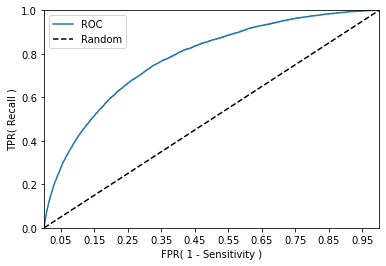

In [ ]:
# ROC curve
def roc_curve_plot(y_test , pred_proba_c1):
    # 임곗값에 따른 FPR, TPR 값을 반환 받음. 
    fprs , tprs , thresholds = roc_curve(y_test ,pred_proba_c1)

    # ROC Curve를 plot 곡선으로 그림. 
    plt.plot(fprs , tprs, label='ROC')
    # 가운데 대각선 직선을 그림. 
    plt.plot([0, 1], [0, 1], 'k--', label='Random')
    
    # FPR X 축의 Scale을 0.1 단위로 변경, X,Y 축명 설정등   
    start, end = plt.xlim()
    plt.xticks(np.round(np.arange(start, end, 0.1),2))
    plt.xlim(0,1); plt.ylim(0,1)
    plt.xlabel('FPR( 1 - Sensitivity )'); plt.ylabel('TPR( Recall )')
    plt.legend()
    plt.show()
    
roc_curve_plot(y_test, pred_proba)

##### cross validation 으로 hyper parameter 재 tuning

In [ ]:
bayesian_params = {
    'max_depth': (6, 16), 
    'num_leaves': (24, 64), 
    'min_data_in_leaf': (10, 200), # min_child_samples
    'min_child_weight':(1, 50),
    'bagging_fraction':(0.5, 1.0), # subsample
    'feature_fraction': (0.5, 1.0), # colsample_bytree
    'max_bin':(10, 500),
    'lambda_l2':(0.001, 10), # reg_lambda
    'lambda_l1': (0.01, 50) # reg_alpha
}

In [ ]:
import lightgbm as lgb

train_data = lgb.Dataset(data=ftr_app, label=target_app, free_raw_data=False)
def lgb_roc_eval_cv(max_depth, num_leaves, min_data_in_leaf, min_child_weight, bagging_fraction, 
                 feature_fraction,  max_bin, lambda_l2, lambda_l1):   
    params = {
        "num_iterations":500, "learning_rate":0.02,
        'early_stopping_rounds':100, 'metric':'auc',
        'max_depth': int(round(max_depth)), #  호출 시 실수형 값이 들어오므로 실수형 하이퍼 파라미터는 정수형으로 변경 
        'num_leaves': int(round(num_leaves)), 
        'min_data_in_leaf': int(round(min_data_in_leaf)),
        'min_child_weight': int(round(min_child_weight)),
        'bagging_fraction': max(min(bagging_fraction, 1), 0), 
        'feature_fraction': max(min(feature_fraction, 1), 0),
        'max_bin':  max(int(round(max_bin)),10),
        'lambda_l2': max(lambda_l2,0),
        'lambda_l1': max(lambda_l1, 0)
    }
    # 파이썬 lightgbm의 cv 메소드를 사용. 
    
    cv_result = lgb.cv(params, train_data, nfold=3, seed=0,  verbose_eval =100,  early_stopping_rounds=50, metrics=['auc'])
    return max(cv_result['auc-mean'])   

In [ ]:
# BayesianOptimization객체를 수행할 함수와 search할 parameter 범위를 설정하여 생성. 
lgbBO = BayesianOptimization(lgb_roc_eval_cv,bayesian_params , random_state=0)
# 함수 반환값이 최대가 되는 입력값 유추를 위한 iteration 수행. 
lgbBO.maximize(init_points=5, n_iter=25)

|   iter    |  target   | baggin... | featur... | lambda_l1 | lambda_l2 |  max_bin  | max_depth | min_ch... | min_da... | num_le... |
-------------------------------------------------------------------------------------------------------------------------------------


C:\Users\channee\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))
C:\Users\channee\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning: Found `early_stopping_rounds` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.163181 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 20217
[LightGBM] [Info] Number of data points in the train set: 205007, number of used features: 164
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.229890 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 20217
[LightGBM] [Info] Number of data points in the train set: 205007, number of used features: 164
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.170975 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 20217
[LightGBM] [Info] Number of data points in the train set: 205008, number of used features: 164
[LightGBM] [Info] Start training from score 0.080729
[LightGBM] [Info] Start training from score 0.080729
[LightGBM

C:\Users\channee\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))
C:\Users\channee\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning: Found `early_stopping_rounds` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.150128 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 39937
[LightGBM] [Info] Number of data points in the train set: 205007, number of used features: 170
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.269771 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 39937
[LightGBM] [Info] Number of data points in the train set: 205007, number of used features: 170
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.220449 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 39937
[LightGBM] [Info] Number of data points in the train set: 205008, number of used features: 170
[LightGBM] [Info] Start training from score 0.080729
[LightGBM] [Info] Start training from score 0.080729
[LightGBM

C:\Users\channee\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))
C:\Users\channee\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning: Found `early_stopping_rounds` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.031859 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 21674
[LightGBM] [Info] Number of data points in the train set: 205007, number of used features: 166
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.145476 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21674
[LightGBM] [Info] Number of data points in the train set: 205007, number of used features: 166
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.217018 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 21674
[LightGBM] [Info] Number of data points in the train set: 205008, number of used features: 166
[LightGBM] [Info] Start training from score 0.08072

C:\Users\channee\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))
C:\Users\channee\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning: Found `early_stopping_rounds` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.216285 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 34163
[LightGBM] [Info] Number of data points in the train set: 205007, number of used features: 170
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.147815 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 34163
[LightGBM] [Info] Number of data points in the train set: 205007, number of used features: 170
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.213175 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 34163
[LightGBM] [Info] Number of data points in the train set: 205008, number of used features: 170
[LightGBM] [Info] Start training from score 0.080729
[LightGBM] [Info] Start training from score 0.080729
[LightGBM

C:\Users\channee\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))
C:\Users\channee\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning: Found `early_stopping_rounds` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.223108 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 17490
[LightGBM] [Info] Number of data points in the train set: 205007, number of used features: 170
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.163106 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 17490
[LightGBM] [Info] Number of data points in the train set: 205007, number of used features: 170
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019565 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 17490
[LightGBM] [Info] Number of data points in the train set: 205008, number of used features: 170
[LightGBM] [Info] Start training from score 0.08072

C:\Users\channee\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))
C:\Users\channee\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning: Found `early_stopping_rounds` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.231705 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 20299
[LightGBM] [Info] Number of data points in the train set: 205007, number of used features: 164
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018600 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 20299
[LightGBM] [Info] Number of data points in the train set: 205007, number of used features: 164
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017201 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 20299
[LightGBM] [Info] Number of data points in the train set: 205008, number of used f

C:\Users\channee\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))
C:\Users\channee\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning: Found `early_stopping_rounds` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.292215 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 37203
[LightGBM] [Info] Number of data points in the train set: 205007, number of used features: 169
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.169085 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 37203
[LightGBM] [Info] Number of data points in the train set: 205007, number of used features: 169
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.222382 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 37203
[LightGBM] [Info] Number of data points in the train set: 205008, number of used features: 169
[LightGBM] [Info] Start training from score 0.080729
[LightGBM] [Info] Start training from score 0.080729
[LightGBM

C:\Users\channee\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))
C:\Users\channee\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning: Found `early_stopping_rounds` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.166676 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 17390
[LightGBM] [Info] Number of data points in the train set: 205007, number of used features: 164
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.228066 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 17390
[LightGBM] [Info] Number of data points in the train set: 205007, number of used features: 164
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020179 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 17390
[LightGBM] [Info] Number of data points in the train set: 205008, number of used features: 164
[LightGBM] [Info] Start training from score 0.08072

C:\Users\channee\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))
C:\Users\channee\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning: Found `early_stopping_rounds` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021471 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 12896
[LightGBM] [Info] Number of data points in the train set: 205007, number of used features: 164
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024637 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 12896
[LightGBM] [Info] Number of data points in the train set: 205007, number of used features: 164
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021677 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 12896
[LightGBM] [Info] 

C:\Users\channee\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))
C:\Users\channee\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning: Found `early_stopping_rounds` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017705 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 19499
[LightGBM] [Info] Number of data points in the train set: 205007, number of used features: 164
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019306 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 19499
[LightGBM] [Info] Number of data points in the train set: 205007, number of used features: 164
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.258748 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 19499
[LightGBM] [Info] Number of data points in the train set: 205008, number of used f

C:\Users\channee\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))
C:\Users\channee\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning: Found `early_stopping_rounds` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021861 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 19007
[LightGBM] [Info] Number of data points in the train set: 205007, number of used features: 164
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.025572 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 19007
[LightGBM] [Info] Number of data points in the train set: 205007, number of used features: 164
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023354 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 19007
[LightGBM] [Info] 

C:\Users\channee\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))
C:\Users\channee\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning: Found `early_stopping_rounds` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.264825 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 16402
[LightGBM] [Info] Number of data points in the train set: 205007, number of used features: 165
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.224450 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 16402
[LightGBM] [Info] Number of data points in the train set: 205007, number of used features: 165
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.222576 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 16402
[LightGBM] [Info] Number of data points in the train set: 205008, number of used features: 165
[LightGBM] [Info] Start training from score 0.080729
[LightGBM] [Info] Start training from score 0.080729
[LightGBM

C:\Users\channee\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))
C:\Users\channee\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning: Found `early_stopping_rounds` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.220884 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 19579
[LightGBM] [Info] Number of data points in the train set: 205007, number of used features: 164
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.166716 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 19579
[LightGBM] [Info] Number of data points in the train set: 205007, number of used features: 164
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.153352 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 19579
[LightGBM] [Info] Number of data points in the train set: 205008, number of used features: 164
[LightGBM] [Info] Start training from score 0.080729
[LightGBM] [Info] Start training from score 0.080729
[LightGBM

C:\Users\channee\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))
C:\Users\channee\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning: Found `early_stopping_rounds` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.170049 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 16894
[LightGBM] [Info] Number of data points in the train set: 205007, number of used features: 164
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn

C:\Users\channee\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))
C:\Users\channee\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning: Found `early_stopping_rounds` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019978 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 16816
[LightGBM] [Info] Number of data points in the train set: 205007, number of used features: 165
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.022800 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 16816
[LightGBM] [Info] Number of data points in the train set: 205007, number of used features: 165
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.221621 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 16816
[LightGBM] [Info] Number of data points in the train set: 205008, number of used f

C:\Users\channee\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))
C:\Users\channee\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning: Found `early_stopping_rounds` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.161626 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 34319
[LightGBM] [Info] Number of data points in the train set: 205007, number of used features: 170
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.036407 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 34319
[LightGBM] [Info] Number of data points in the train set: 205007, number of used features: 170
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.275589 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 34319
[LightGBM] [Info] Number of data points in the train set: 205008, number of used features: 170
[LightGBM] [Info] Start training from score 0.08072

C:\Users\channee\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))
C:\Users\channee\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning: Found `early_stopping_rounds` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.222346 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 36283
[LightGBM] [Info] Number of data points in the train set: 205007, number of used features: 167
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.226372 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 36283
[LightGBM] [Info] Number of data points in the train set: 205007, number of used features: 167
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.266766 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 36283
[LightGBM] [Info] Number of data points in the train set: 205008, number of used features: 167
[LightGBM] [Info] Start training from score 0.080729
[LightGBM] [Info] Start training from score 0.080729
[LightGBM

C:\Users\channee\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))
C:\Users\channee\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning: Found `early_stopping_rounds` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020385 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 17800
[LightGBM] [Info] Number of data points in the train set: 205007, number of used features: 164
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017535 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 17800
[LightGBM] [Info] Number of data points in the train set: 205007, number of used features: 164
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014516 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 17800
[LightGBM] [Info] 

C:\Users\channee\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))
C:\Users\channee\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning: Found `early_stopping_rounds` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.221313 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 27374
[LightGBM] [Info] Number of data points in the train set: 205007, number of used features: 166
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.219466 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 27374
[LightGBM] [Info] Number of data points in the train set: 205007, number of used features: 166
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.153893 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 27374
[LightGBM] [Info] Number of data points in the train set: 205008, number of used features: 166
[LightGBM] [Info] Start training from score 0.080729
[LightGBM] [Info] Start training from score 0.080729
[LightGBM

C:\Users\channee\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))
C:\Users\channee\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning: Found `early_stopping_rounds` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.028651 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 16818
[LightGBM] [Info] Number of data points in the train set: 205007, number of used features: 166
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018467 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 16818
[LightGBM] [Info] Number of data points in the train set: 205007, number of used features: 166
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017772 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 16818
[LightGBM] [Info] 

C:\Users\channee\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))
C:\Users\channee\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning: Found `early_stopping_rounds` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.169408 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 41759
[LightGBM] [Info] Number of data points in the train set: 205007, number of used features: 164
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.215377 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 41759
[LightGBM] [Info] Number of data points in the train set: 205007, number of used features: 164
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.221710 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 41759
[LightGBM] [Info] Number of data points in the train set: 205008, number of used features: 164
[LightGBM] [Info] Start training from score 0.080729
[LightGBM] [Info] Start training from score 0.080729
[LightGBM

C:\Users\channee\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))
C:\Users\channee\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning: Found `early_stopping_rounds` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021007 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5318
[LightGBM] [Info] Number of data points in the train set: 205007, number of used features: 166
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020654 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5318
[LightGBM] [Info] Number of data points in the train set: 205007, number of used features: 166
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020216 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5318
[LightGBM] [Info] Num

C:\Users\channee\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))
C:\Users\channee\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning: Found `early_stopping_rounds` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.163681 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 33376
[LightGBM] [Info] Number of data points in the train set: 205007, number of used features: 166
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.270704 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 33376
[LightGBM] [Info] Number of data points in the train set: 205007, number of used features: 166
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.225304 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 33376
[LightGBM] [Info] Number of data points in the train set: 205008, number of used features: 166
[LightGBM] [Info] Start training from score 0.080729
[LightGBM] [Info] Start training from score 0.080729
[LightGBM

C:\Users\channee\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))
C:\Users\channee\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning: Found `early_stopping_rounds` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.261242 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 17478
[LightGBM] [Info] Number of data points in the train set: 205007, number of used features: 164
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.221486 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 17478
[LightGBM] [Info] Number of data points in the train set: 205007, number of used features: 164
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.022389 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 17478
[LightGBM] [Info] Number of data points in the train set: 205008, number of used features: 164
[LightGBM] [Info] Start training from score 0.08072

C:\Users\channee\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))
C:\Users\channee\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning: Found `early_stopping_rounds` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.264848 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 14077
[LightGBM] [Info] Number of data points in the train set: 205007, number of used features: 167
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.217247 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 14077
[LightGBM] [Info] Number of data points in the train set: 205007, number of used features: 167
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.223460 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 14077
[LightGBM] [Info] Number of data points in the train set: 205008, number of used features: 167
[LightGBM] [Info] Start training from score 0.080729
[LightGBM] [Info] Start training from score 0.080729
[LightGBM

C:\Users\channee\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))
C:\Users\channee\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning: Found `early_stopping_rounds` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.267075 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 11051
[LightGBM] [Info] Number of data points in the train set: 205007, number of used features: 167
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.221536 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 11051
[LightGBM] [Info] Number of data points in the train set: 205007, number of used features: 167
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.169461 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 11051
[LightGBM] [Info] Number of data points in the train set: 205008, number of used features: 167
[LightGBM] [Info] Start training from score 0.080729
[LightGBM] [Info] Start training from score 0.080729
[LightGBM

C:\Users\channee\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))
C:\Users\channee\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning: Found `early_stopping_rounds` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.023574 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 18842
[LightGBM] [Info] Number of data points in the train set: 205007, number of used features: 164
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024873 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 18842
[LightGBM] [Info] Number of data points in the train set: 205007, number of used features: 164
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024455 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 18842
[LightGBM] [Info] 

C:\Users\channee\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))
C:\Users\channee\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning: Found `early_stopping_rounds` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.022653 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 14825
[LightGBM] [Info] Number of data points in the train set: 205007, number of used features: 166
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024379 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 14825
[LightGBM] [Info] Number of data points in the train set: 205007, number of used features: 166
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.022400 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 14825
[LightGBM] [Info] 

C:\Users\channee\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))
C:\Users\channee\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning: Found `early_stopping_rounds` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018247 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 15329
[LightGBM] [Info] Number of data points in the train set: 205007, number of used features: 166
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018926 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 15329
[LightGBM] [Info] Number of data points in the train set: 205007, number of used features: 166
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021225 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 15329
[LightGBM] [Info] 

C:\Users\channee\anaconda3\lib\site-packages\lightgbm\engine.py:527: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))
C:\Users\channee\anaconda3\lib\site-packages\lightgbm\engine.py:532: UserWarning: Found `early_stopping_rounds` in params. Will use it instead of argument
  _log_warning("Found `{}` in params. Will use it instead of argument".format(alias))


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020594 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 15248
[LightGBM] [Info] Number of data points in the train set: 205007, number of used features: 167
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020154 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 15248
[LightGBM] [Info] Number of data points in the train set: 205007, number of used features: 167
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016801 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 15248
[LightGBM] [Info] 

In [ ]:
lgbBO.res

[{'target': 0.7704130128940919,
  'params': {'bagging_fraction': 0.7744067519636624,
   'feature_fraction': 0.8575946831862098,
   'lambda_l1': 30.142141169821482,
   'lambda_l2': 5.449286946785972,
   'max_bin': 217.5908516760633,
   'max_depth': 12.458941130666561,
   'min_child_weight': 22.441773351871934,
   'min_data_in_leaf': 179.43687014859515,
   'num_leaves': 62.54651042004117}},
 {'target': 0.7707320615580647,
  'params': {'bagging_fraction': 0.6917207594128889,
   'feature_fraction': 0.8958625190413323,
   'lambda_l1': 26.449457038447697,
   'lambda_l2': 5.680877566378229,
   'max_bin': 463.5423527634039,
   'max_depth': 6.710360581978869,
   'min_child_weight': 5.269335685375495,
   'min_data_in_leaf': 13.841495513661886,
   'num_leaves': 57.30479382191752}},
 {'target': 0.7674060125927115,
  'params': {'bagging_fraction': 0.8890783754749252,
   'feature_fraction': 0.9350060741234096,
   'lambda_l1': 48.93113092821587,
   'lambda_l2': 7.99178648360302,
   'max_bin': 236.124

In [ ]:
target_list = []
for result in lgbBO.res:
    target = result['target']
    target_list.append(target)
print(target_list)
# 가장 큰 target 값을 가지는 순번(index)를 추출
print('maximum target index:', np.argmax(np.array(target_list)))

[0.7704130128940919, 0.7707320615580647, 0.7674060125927115, 0.7706174479634317, 0.7692640265604144, 0.7707441174483378, 0.770229710649176, 0.7719096310120473, 0.7691251381694691, 0.7705267701934897, 0.7710389366063817, 0.7718773672753726, 0.7711454074315656, 0.7695691149218623, 0.7724457191365559, 0.7702728801817355, 0.7691546772195966, 0.7718560657970831, 0.7708603583870698, 0.7719703571205899, 0.77054013792762, 0.7684607098023677, 0.7687114634910718, 0.7718111662970083, 0.7716905284261153, 0.7701900669922322, 0.7708307863985207, 0.7719997542250262, 0.7722128809560068, 0.7709315329107215]
maximum target index: 14


In [ ]:
max_dict = lgbBO.res[np.argmax(np.array(target_list))]
print(max_dict)

{'target': 0.7724457191365559, 'params': {'bagging_fraction': 0.9299169469599182, 'feature_fraction': 0.5746809011453164, 'lambda_l1': 7.543441207233135, 'lambda_l2': 3.292195078359306, 'max_bin': 177.94521484058205, 'max_depth': 10.61966768561966, 'min_child_weight': 1.397663097770165, 'min_data_in_leaf': 166.95618212603793, 'num_leaves': 54.18985368611588}}


In [ ]:
ftr_app = apps_all_train.drop(['SK_ID_CURR', 'TARGET'], axis=1)
target_app = apps_all_train['TARGET']

X_train, X_test, y_train, y_test = train_test_split(ftr_app, target_app, test_size=0.3, random_state=2020)
print('train shape:', train_x.shape, 'valid shape:', valid_x.shape)
lgbm_wrapper = LGBMClassifier(
    n_jobs=-1,
    n_estimators=1000,
    learning_rate=0.02,
    max_depth = 11,
    num_leaves=54,
    colsample_bytree=0.574,
    subsample=0.930,
    max_bin=403,
    reg_alpha=7.543,
    reg_lambda=3.292,
    min_child_weight=1,
    min_child_samples=167,
    silent=-1,
    verbose=-1,
    )



evals = [(X_test, y_test)]
lgbm_wrapper.fit(X_train, y_train, early_stopping_rounds=100, eval_metric="auc", eval_set=evals, verbose=100)
preds = lgbm_wrapper.predict(X_test)
pred_proba = lgbm_wrapper.predict_proba(X_test)[:, 1]

train shape: (215257, 174) valid shape: (92254, 174)
Training until validation scores don't improve for 100 rounds
[100]	valid_0's auc: 0.759222	valid_0's binary_logloss: 0.248113
[200]	valid_0's auc: 0.769117	valid_0's binary_logloss: 0.24319
[300]	valid_0's auc: 0.773816	valid_0's binary_logloss: 0.241396
[400]	valid_0's auc: 0.77635	valid_0's binary_logloss: 0.24053
[500]	valid_0's auc: 0.777994	valid_0's binary_logloss: 0.239917
[600]	valid_0's auc: 0.77869	valid_0's binary_logloss: 0.239651
[700]	valid_0's auc: 0.779292	valid_0's binary_logloss: 0.239452
[800]	valid_0's auc: 0.779592	valid_0's binary_logloss: 0.239369
[900]	valid_0's auc: 0.77968	valid_0's binary_logloss: 0.239334
[1000]	valid_0's auc: 0.779873	valid_0's binary_logloss: 0.239287
Did not meet early stopping. Best iteration is:
[998]	valid_0's auc: 0.779896	valid_0's binary_logloss: 0.239281


In [ ]:
get_clf_eval(y_test, preds, pred_proba)

오차 행렬
[[84646   187]
 [ 7200   221]]
정확도: 0.9199, 정밀도: 0.5417, 재현율: 0.0298,          F1: 0.0565, AUC:0.7799


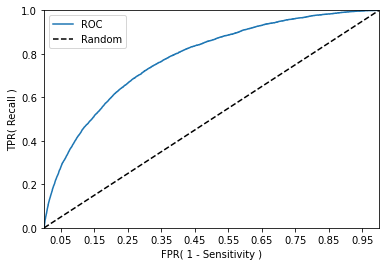

In [ ]:
roc_curve_plot(y_test, pred_proba)